# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import re

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import scale
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline


from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
%matplotlib inline

# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Maximum Rows and columns display
pd.set_option('display.max_rows', 10000)
pd.set_option('display.max_columns', 10000)

In [3]:
data=pd.read_csv('train.csv')
data.head() # Head of data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
# Shape of data
data.shape

(1460, 81)

In [5]:
# Data Information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
data.isnull().agg('mean')

Id               0.000000
MSSubClass       0.000000
MSZoning         0.000000
LotFrontage      0.177397
LotArea          0.000000
Street           0.000000
Alley            0.937671
LotShape         0.000000
LandContour      0.000000
Utilities        0.000000
LotConfig        0.000000
LandSlope        0.000000
Neighborhood     0.000000
Condition1       0.000000
Condition2       0.000000
BldgType         0.000000
HouseStyle       0.000000
OverallQual      0.000000
OverallCond      0.000000
YearBuilt        0.000000
YearRemodAdd     0.000000
RoofStyle        0.000000
RoofMatl         0.000000
Exterior1st      0.000000
Exterior2nd      0.000000
MasVnrType       0.005479
MasVnrArea       0.005479
ExterQual        0.000000
ExterCond        0.000000
Foundation       0.000000
BsmtQual         0.025342
BsmtCond         0.025342
BsmtExposure     0.026027
BsmtFinType1     0.025342
BsmtFinSF1       0.000000
BsmtFinType2     0.026027
BsmtFinSF2       0.000000
BsmtUnfSF        0.000000
TotalBsmtSF 

In [7]:
data.shape

(1460, 81)

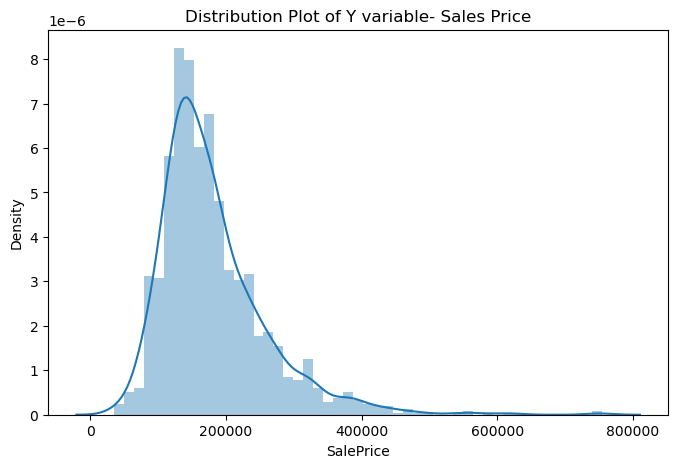

In [8]:
plt.figure(figsize=(8,5))
sns.distplot(data['SalePrice'])
plt.title('Distribution Plot of Y variable- Sales Price')
plt.show()

In [44]:
#!pip install sweetviz

In [45]:
#Auto EDA
import sweetviz as sv
sweet_report = sv.analyze(data,target_feat='SalePrice',pairwise_analysis='on')
sweet_report.show_html('sweet_report.html')

                                             |                                             | [  0%]   00:00 ->…

Report sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



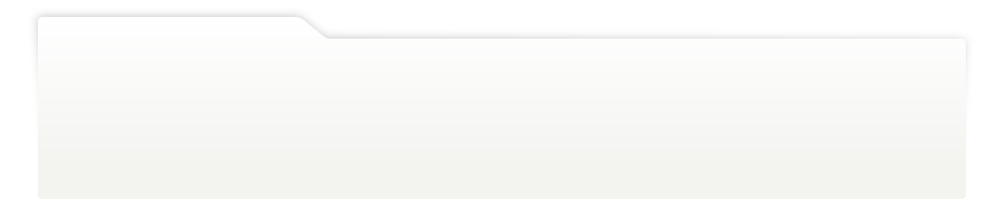
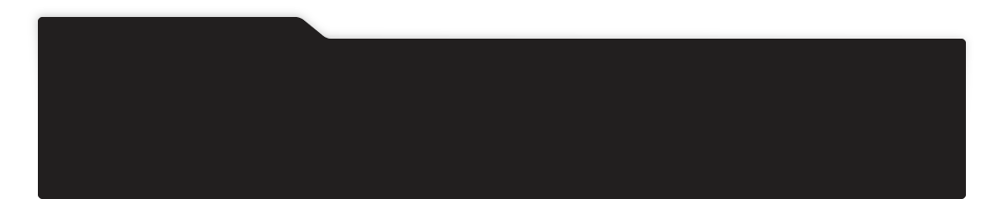
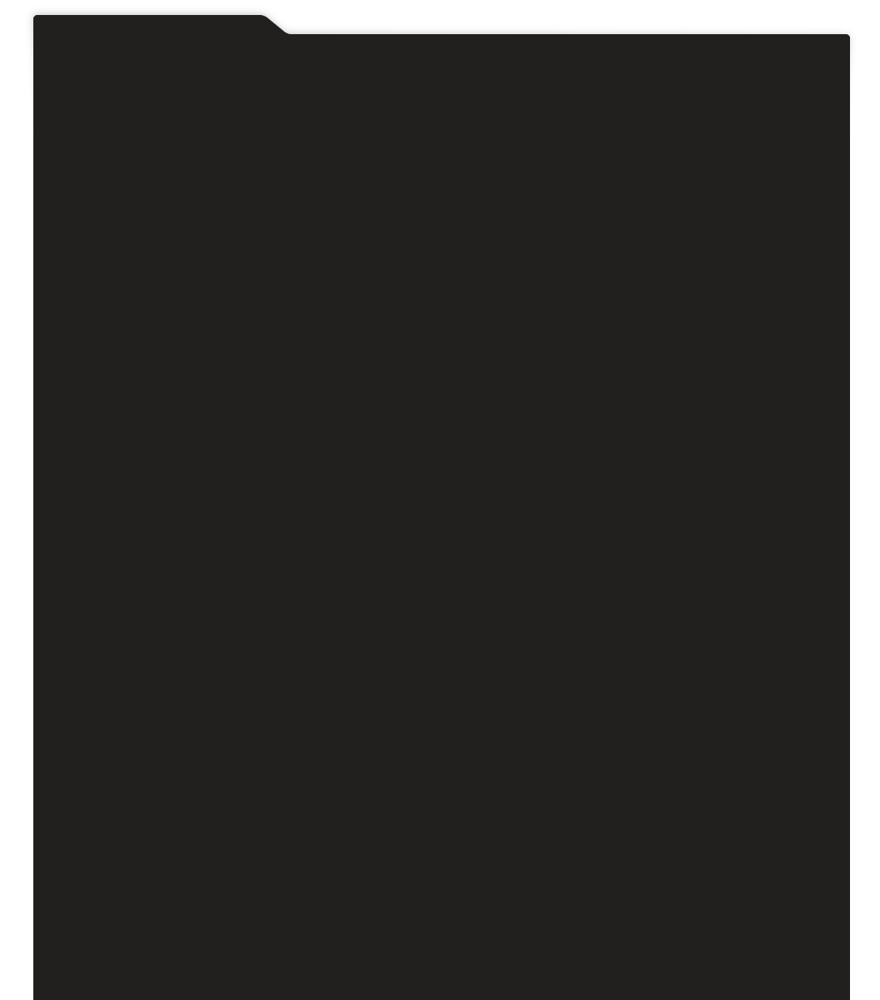
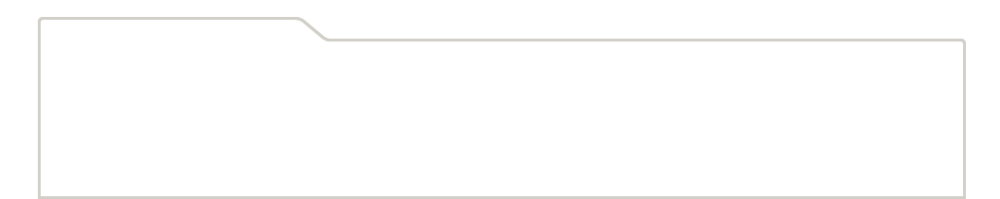
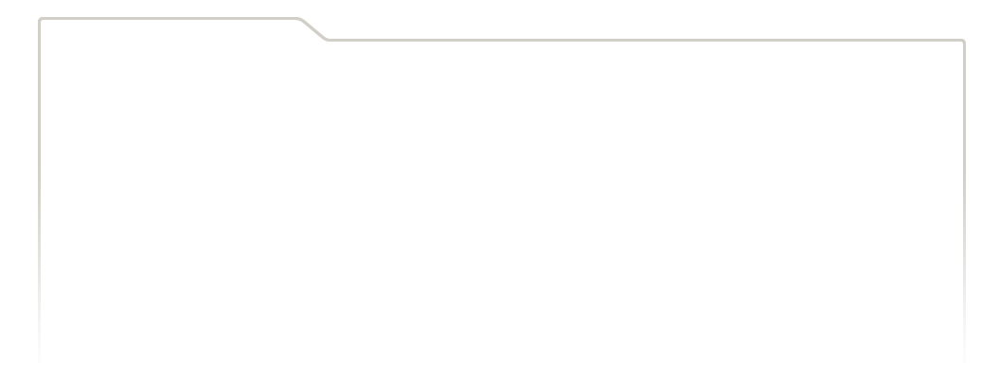
...
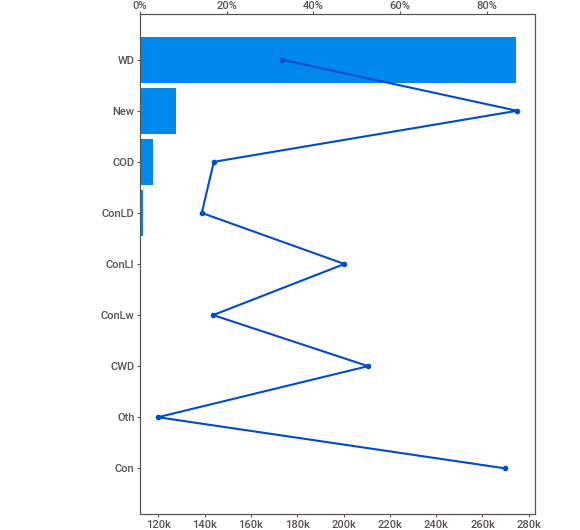
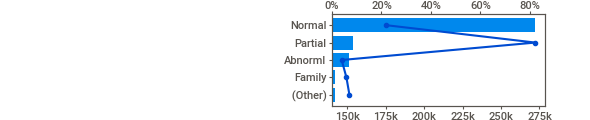
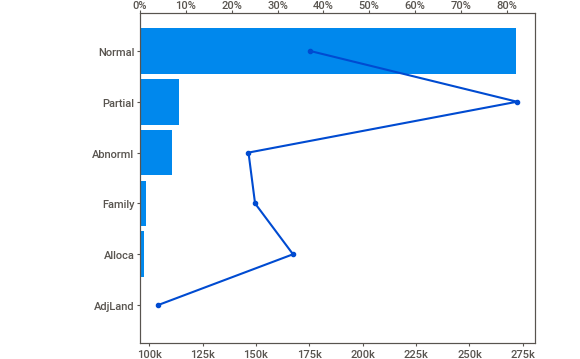
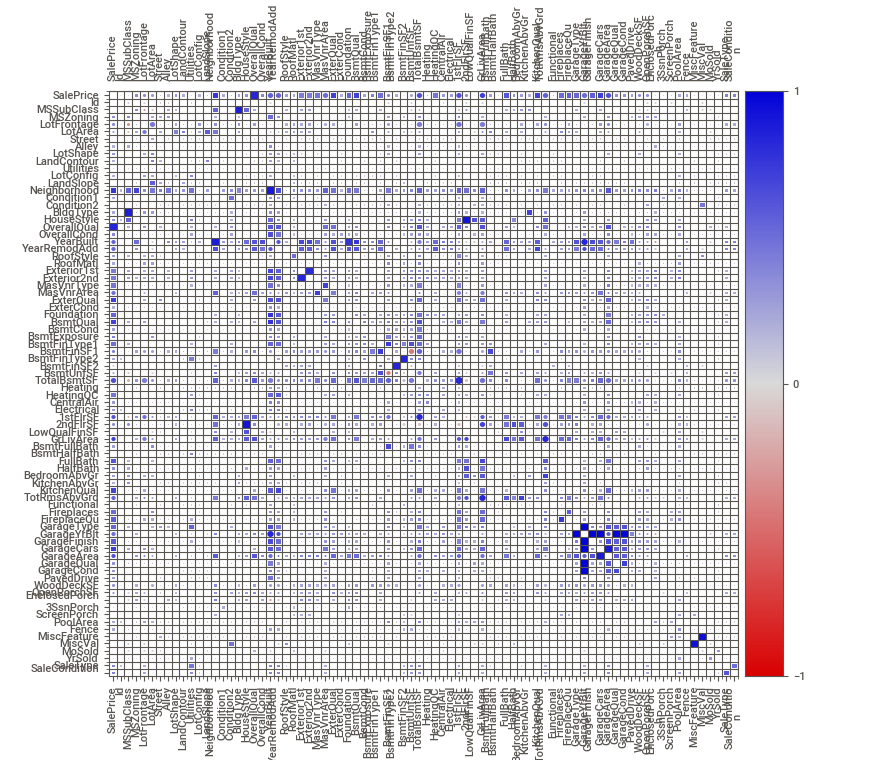
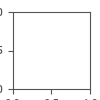

In [69]:
sweet_report.show_notebook()

In [9]:
print("Skewness: %f" % data['SalePrice'].skew())
print("Kurtosis: %f" % data['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


In [10]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


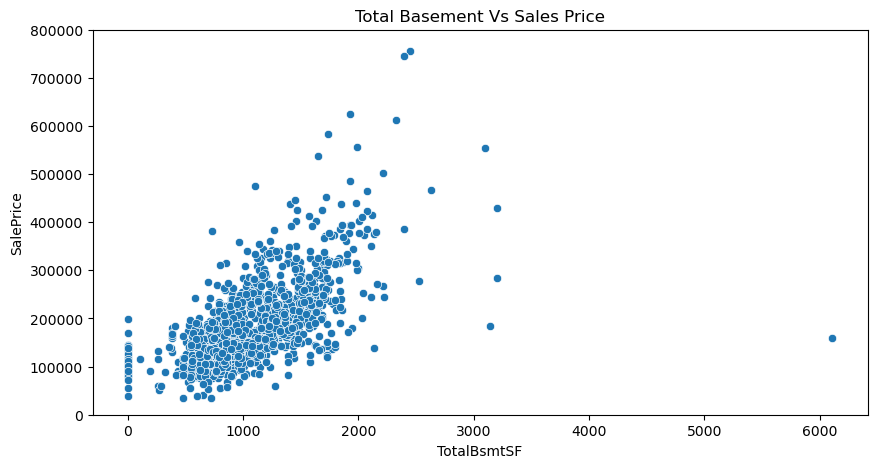

In [11]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=data,x='TotalBsmtSF',y='SalePrice',)
plt.axis(ymin=0, ymax=800000)
plt.title('Total Basement Vs Sales Price')
plt.show()

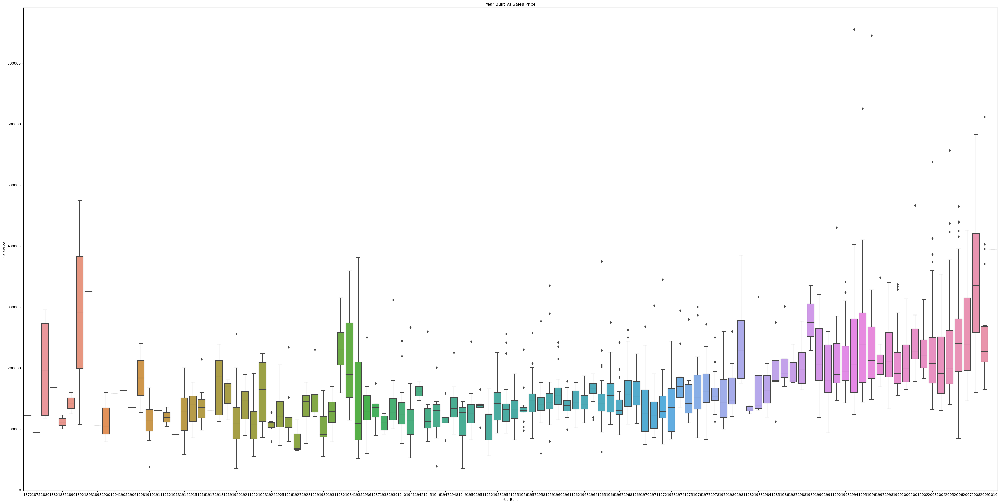

In [13]:
plt.figure(figsize=(50,25))
sns.boxplot(x='YearBuilt', y="SalePrice", data=data)
plt.title('Year Built Vs Sales Price')
plt.show()

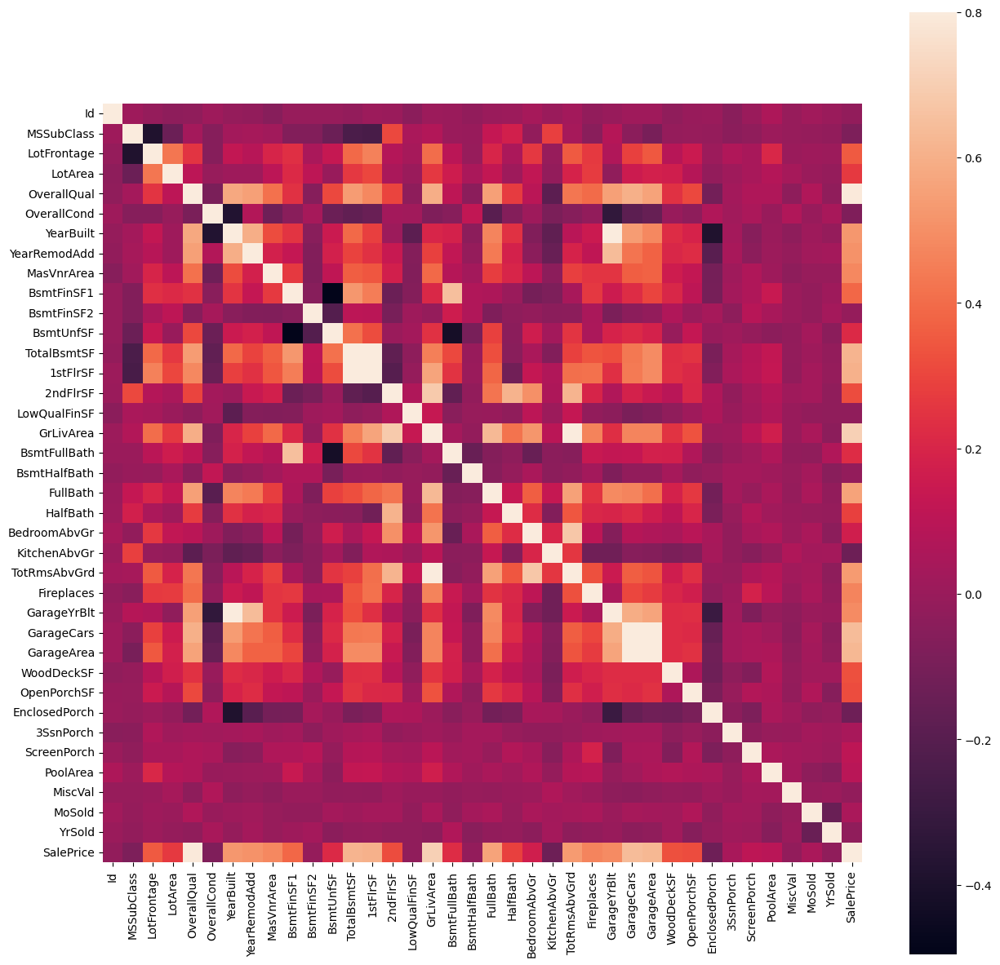

In [14]:
#correlation matrix
corrmat = data.corr()
f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corrmat, vmax=.8, square=True);

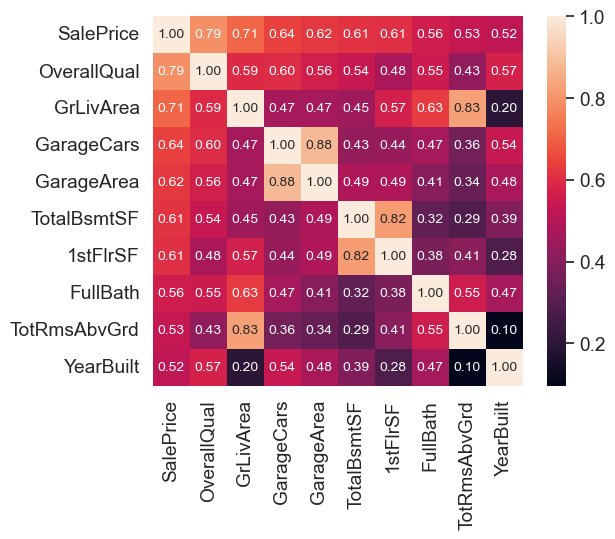

In [15]:
#saleprice correlation matrix
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(data[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

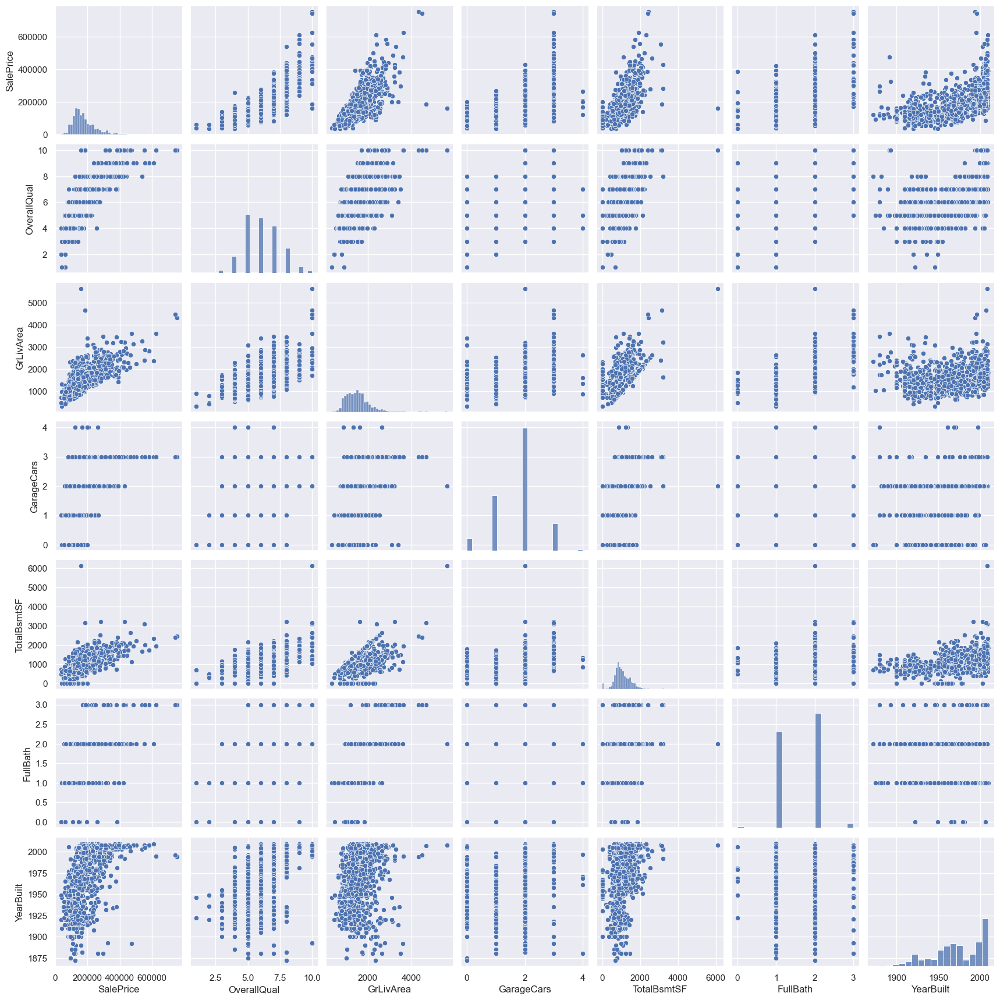

In [15]:
#scatterplot
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(data[cols], size = 2.5)
plt.show();

# Handling Missing Data

In [16]:
#missing data
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479


In [17]:
# features on the description data file provided

null_has_meaning = ["Alley", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", "MiscFeature"]

In [18]:
for i in null_has_meaning:
    data[i].fillna("None", inplace=True)
    data[i].fillna("None", inplace=True)

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1460 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

# Imputing "Real" NaN Values

In [20]:
#from sklearn.preprocessing import Imputer
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values = np.nan, strategy="median")

In [21]:
#missing data
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(6)

,Total,Percent
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
MasVnrType,8,0.005479
MasVnrArea,8,0.005479
Electrical,1,0.000685
KitchenQual,0,0.000000


LotFrontage has too many Null values and it is a numerical value so it may be better to just drop it.

In [22]:
data.drop("LotFrontage", axis=1, inplace=True)

In [23]:
# Missing data information
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
GarageYrBlt,81,0.055479
MasVnrType,8,0.005479
MasVnrArea,8,0.005479
Electrical,1,0.000685
KitchenQual,0,0.000000


GarageYrBlt, MasVnrArea, and MasVnrType all have a fairly decent amount of missing values. MasVnrType is categorical so we can replace the missing values with "None", as we did before. We can fill the others with median.

In [24]:
data["GarageYrBlt"].fillna(data["GarageYrBlt"].median(), inplace=True)
data["MasVnrArea"].fillna(data["MasVnrArea"].median(), inplace=True)
data["MasVnrType"].fillna("None", inplace=True)

In [25]:
# Missing data information
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
Electrical,1,0.000685
MSSubClass,0,0.000000
GarageYrBlt,0,0.000000
GarageType,0,0.000000
FireplaceQu,0,0.000000


Now that only one row has a null entry, we will drop the row.

In [26]:
data.dropna(inplace=True)

In [27]:
# Missing data information
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
Id,0,0.0
MSSubClass,0,0.0
GarageYrBlt,0,0.0
GarageType,0,0.0
FireplaceQu,0,0.0


In [28]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1459 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1459 non-null   object 
 3   LotArea        1459 non-null   int64  
 4   Street         1459 non-null   object 
 5   Alley          1459 non-null   object 
 6   LotShape       1459 non-null   object 
 7   LandContour    1459 non-null   object 
 8   Utilities      1459 non-null   object 
 9   LotConfig      1459 non-null   object 
 10  LandSlope      1459 non-null   object 
 11  Neighborhood   1459 non-null   object 
 12  Condition1     1459 non-null   object 
 13  Condition2     1459 non-null   object 
 14  BldgType       1459 non-null   object 
 15  HouseStyle     1459 non-null   object 
 16  OverallQual    1459 non-null   int64  
 17  OverallCond    1459 non-null   int64  
 18  YearBuil

In [273]:
#Auto EDA
import sweetviz as sv
sweet_report = sv.analyze(data,pairwise_analysis="off")
sweet_report.show_html('sweet_report_1.html')

                                             |                                             | [  0%]   00:00 ->…

Report sweet_report_1.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Splitting to Catgorical and continous data

In [29]:
types_train = data.dtypes #type of each feature in data: int, float, object
num_train = types_train[(types_train == 'int64') | (types_train == float)] #numerical values are either type int or float
cat_train = types_train[types_train == object] #categorical values are type object

In [30]:
pd.DataFrame(types_train).reset_index().set_index(0).reset_index()[0].value_counts()

object     43
int64      35
float64     2
Name: 0, dtype: int64

In [31]:
# Converting num_train to a list to make it easier to work with
numerical_values_train = list(num_train.index)

In [32]:
print(numerical_values_train)

['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


These are all the numerical features in our data.

In [33]:
categorical_values_train = list(cat_train.index)
print(categorical_values_train)

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


These are all the caregorical features in our data.

# Data Preparation

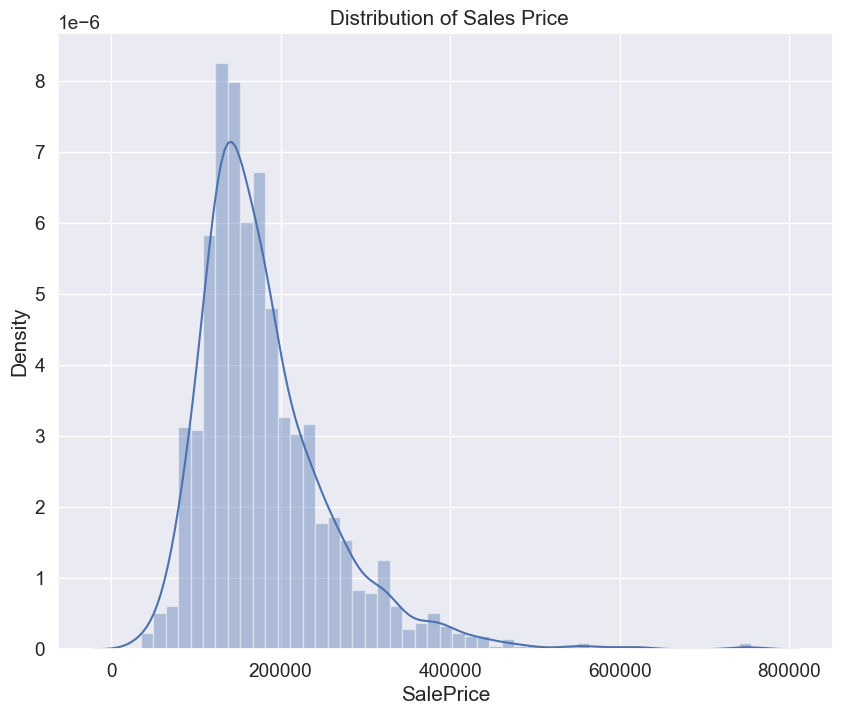

In [34]:
plt.figure(figsize=(10,8))
sns.distplot(data["SalePrice"])
plt.title(' Distribution of Sales Price')
plt.show()

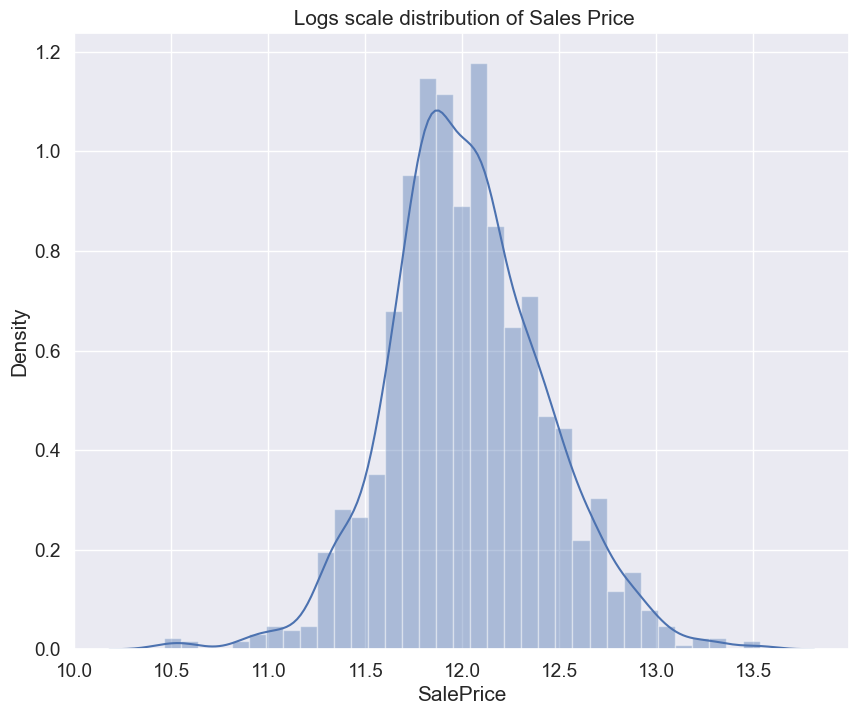

In [35]:

plt.figure(figsize=(10,8))
sns.distplot(np.log(data["SalePrice"]))
plt.title(' Logs scale distribution of Sales Price')
plt.show()

It appears that the target, SalePrice, is very skewed and a transformation like a logarithm would make it more normally distributed. Machine Learning models tend to work much better with normally distributed targets, rather than greatly skewed targets. By transforming the prices, we can boost model performance.

In [36]:
# Transformation of Y varibale SalesPrice to logscale value
data["TransformedPrice"] = np.log(data["SalePrice"])

In [37]:
print(categorical_values_train)

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


In [38]:
for i in categorical_values_train:
    feature_set = set(data[i])
    for j in feature_set:
        feature_list = list(feature_set)
        data.loc[data[i] == j, i] = feature_list.index(j)

In [39]:
feature_list

['Family', 'Abnorml', 'Normal', 'AdjLand', 'Partial', 'Alloca']

In [40]:
data.head()

,Id,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TransformedPrice
0,1,60,0,8450,1,0,2,2,0,2,1,0,2,2,1,3,7,5,2003,2003,1,2,11,12,3,196.0,0,1,2,0,1,2,0,706,5,0,150,856,5,3,1,0,856,854,0,1710,1,0,2,1,3,1,0,8,3,0,5,2,2003.0,3,2,548,1,1,1,0,61,0,0,0,0,1,4,4,0,2,2008,3,2,208500,12.247694
1,2,20,0,9600,1,0,2,2,0,0,1,23,8,2,1,5,6,8,1976,1976,1,2,14,15,0,0.0,2,1,1,0,1,0,3,978,5,0,284,1262,5,3,1,0,1262,0,0,1262,0,1,2,0,3,1,2,6,3,1,1,2,1976.0,3,2,460,1,1,1,298,0,0,0,0,0,1,4,4,0,5,2007,3,2,181500,12.109011
2,3,60,0,11250,1,0,0,2,0,2,1,0,2,2,1,3,7,5,2001,2002,1,2,11,12,3,162.0,0,1,2,0,1,3,0,486,5,0,434,920,5,3,1,0,920,866,0,1786,1,0,2,1,3,1,0,6,3,1,1,2,2001.0,3,2,608,1,1,1,0,42,0,0,0,0,1,4,4,0,9,2008,3,2,223500,12.317167
3,4,70,0,9550,1,0,0,2,0,3,1,13,2,2,1,3,7,5,1915,1970,1,2,4,1,0,0.0,2,1,4,1,0,2,3,216,5,0,540,756,5,0,1,0,961,756,0,1717,1,0,1,0,3,1,0,7,3,1,0,0,1998.0,1,3,642,1,1,1,0,35,272,0,0,0,1,4,4,0,2,2006,3,1,140000,11.849398
4,5,60,0,14260,1,0,0,2,0,0,1,20,2,2,1,3,8,5,2000,2000,1,2,11,12,3,350.0,0,1,2,0,1,1,0,655,5,0,490,1145,5,3,1,0,1145,1053,0,2198,1,0,2,1,4,1,0,9,3,1,1,2,2000.0,3,3,836,1,1,1,192,84,0,0,0,0,1,4,4,0,12,2008,3,2,250000,12.429216


In [41]:
data.shape

(1459, 81)

In [324]:
data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

In [325]:
data.select_dtypes('object').columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [326]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1459 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Id                1459 non-null   int64  
 1   MSSubClass        1459 non-null   int64  
 2   MSZoning          1459 non-null   object 
 3   LotArea           1459 non-null   int64  
 4   Street            1459 non-null   object 
 5   Alley             1459 non-null   object 
 6   LotShape          1459 non-null   object 
 7   LandContour       1459 non-null   object 
 8   Utilities         1459 non-null   object 
 9   LotConfig         1459 non-null   object 
 10  LandSlope         1459 non-null   object 
 11  Neighborhood      1459 non-null   object 
 12  Condition1        1459 non-null   object 
 13  Condition2        1459 non-null   object 
 14  BldgType          1459 non-null   object 
 15  HouseStyle        1459 non-null   object 
 16  OverallQual       1459 non-null   int64  


In [328]:
data.select_dtypes(['int64','float64']).columns

Index(['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice', 'TransformedPrice'],
      dtype='object')

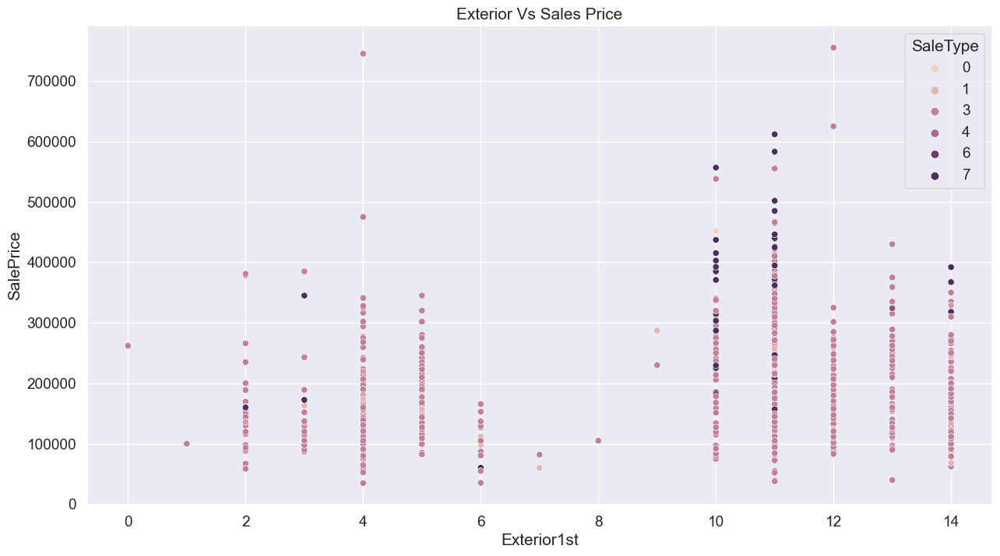

In [335]:
plt.figure(figsize=(15,8))
sns.scatterplot(data=data,x='Exterior1st',y='SalePrice',hue='SaleType')
plt.title('Exterior Vs Sales Price')
plt.show()

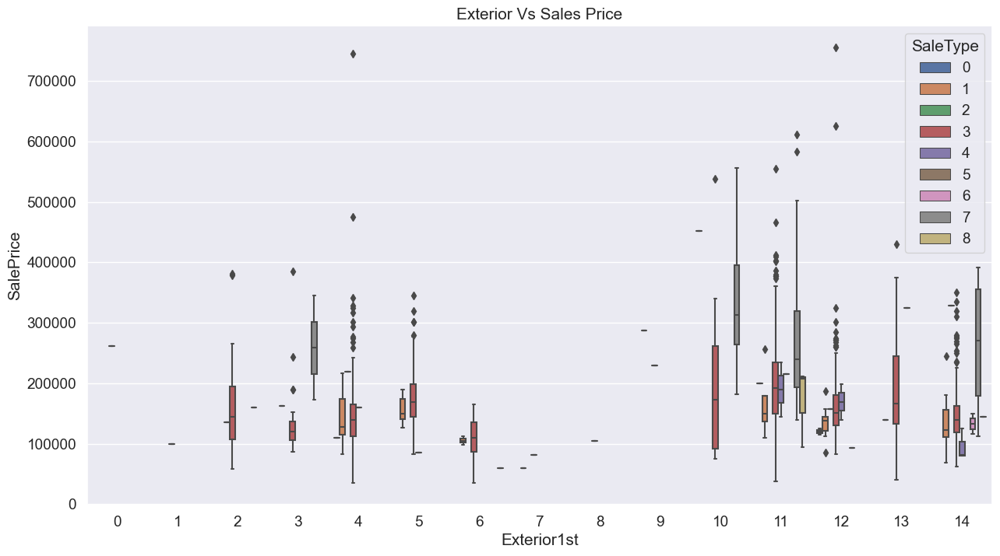

In [331]:
plt.figure(figsize=(15,8))
sns.boxplot(data=data,x='Exterior1st',y='SalePrice',hue='SaleType')
plt.title('Exterior Vs Sales Price')
plt.show()

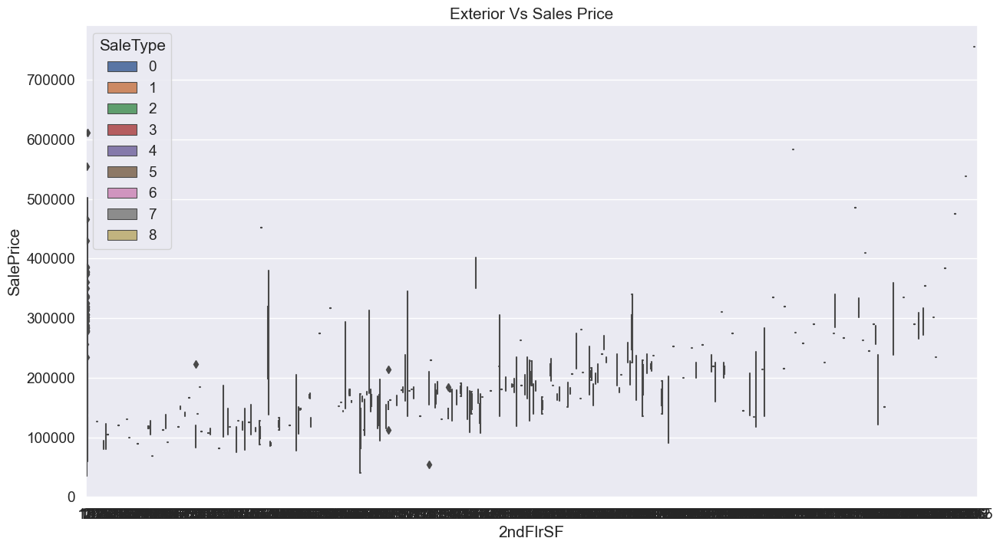

In [334]:
plt.figure(figsize=(15,8))
sns.boxplot(data=data,x='2ndFlrSF',y='SalePrice',hue='SaleType')
plt.title('Exterior Vs Sales Price')
plt.show()

In [61]:
Xy=data.drop(["Id", "SalePrice"],axis=1)
Xy.shape

(1459, 79)

# Re-Scaling the features

In [62]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

df_train, df_test = train_test_split(Xy, train_size = 0.7, test_size = 0.3, random_state = 100)

In [63]:
df_train.shape, df_test.shape

((1021, 79), (438, 79))

In [64]:
df_train.head()

,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TransformedPrice
984,90,2,10125,1,0,3,0,1,4,1,12,1,1,1,3,5,5,1977,1977,2,6,1,1,0,0.0,2,0,1,3,3,2,5,0,5,0,0,0,2,0,1,1,1302,432,0,1734,0,0,2,0,4,2,3,8,2,0,4,1,1977.0,2,2,539,0,0,2,0,0,0,0,0,0,1,3,2,0,8,2009,1,2,11.744037
1416,190,0,11340,1,0,3,0,1,4,1,3,1,1,0,7,4,6,1885,1950,2,6,4,10,0,0.0,2,0,4,0,0,4,4,0,4,0,777,777,2,4,1,1,1246,1044,0,2290,0,0,2,0,4,2,2,11,2,0,4,5,1971.0,2,2,560,0,0,1,0,0,114,0,0,0,1,3,2,0,4,2010,8,2,11.715866
390,50,2,8405,1,1,3,0,1,4,1,10,1,1,2,3,5,8,1900,1950,2,6,10,13,0,0.0,2,0,5,0,4,4,6,241,1,391,229,861,2,3,1,1,961,406,0,1367,1,0,1,0,4,1,2,7,2,0,4,5,1978.0,2,1,384,0,0,2,0,130,112,0,0,0,1,4,2,0,4,2008,8,2,11.686879
877,60,2,8834,1,0,3,0,1,4,1,6,1,1,2,7,9,5,2004,2005,0,6,4,5,3,216.0,3,0,4,2,0,4,0,1170,4,0,292,1462,2,3,1,1,1462,762,0,2224,1,0,2,1,4,1,0,10,2,1,5,1,2004.0,0,3,738,0,0,2,184,0,0,0,0,0,1,3,2,0,6,2009,8,2,12.765688
567,20,2,10171,1,0,1,0,1,4,1,6,1,1,2,0,7,5,2004,2004,2,6,4,5,1,168.0,3,0,4,4,0,4,0,2,4,0,1515,1517,2,3,1,1,1535,0,0,1535,0,0,2,0,3,1,3,7,2,0,4,1,2004.0,3,2,532,0,0,2,0,0,0,0,0,0,1,3,2,0,3,2010,8,2,12.273731


# Model Building

In [42]:
X = data.drop(["Id", "SalePrice", "TransformedPrice"], axis=1).values
y = data["TransformedPrice"].values

In [43]:
X.shape,y.shape

((1459, 78), (1459,))

In [44]:
df=data.drop(["Id", "SalePrice", "TransformedPrice"], axis=1)
df.shape

(1459, 78)

In [45]:
data.shape,X.shape

((1459, 81), (1459, 78))

In [46]:
 data["TransformedPrice"].values

array([12.24769432, 12.10901093, 12.31716669, ..., 12.49312952,
       11.86446223, 11.90158345])

In [53]:
# # split into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                     train_size=0.7,
                                                     test_size = 0.3, random_state=100)

In [48]:
# scaler = MinMaxScaler()
# X_train=scaler.fit_transform(X_train)
# X_test=scaler.transform(X_test)
# X_train.shape, X_test.shape

In [49]:
# scalery = MinMaxScaler()
# y_train=scalery.fit_transform(np.array(y_train).reshape(-1,1))
# y_test=scalery.transform(np.array(y_test).reshape(-1,1))
# y_train.shape, y_test.shape

# Unregularized Linear Regression

In [54]:
#Unregularized Model
from sklearn.linear_model import LinearRegression,Lasso, Ridge
lr = LinearRegression()
lr.fit(X_train,y_train)
print("Training R2")
print(lr.score(X_train,y_train))
print("Testing R2")
print(lr.score(X_test,y_test))

Training R2
0.909254699428769
Testing R2
-2.8066419755013956


In [55]:
#If alpha=0 then overfitting [Unregularised Model]
#Higher the alpha more the regularization more the underfitting
#Lower the alpha lesser the regularization more the overfitting
lr = Lasso(alpha=0.9)
lr.fit(X_train,y_train)
print("Training R2")
print(lr.score(X_train,y_train))
print("Testing R2")
print(lr.score(X_test,y_test))

Training R2
0.7750652474171622
Testing R2
0.7619793903561818


In [56]:
lr.coef_

array([-4.20969078e-05, -0.00000000e+00,  1.35881699e-06,  0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  2.71041429e-03,  1.30624720e-03,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        3.79127629e-05, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
        4.96254507e-05, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        1.73046785e-04,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  4.67855664e-05, -0.00000000e+00,
        2.80415760e-04,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -

## Linear Model Evaluation 

In [88]:
y_pred_train_lr=lr.predict(X_train)
y_pred_test_lr=lr.predict(X_test)


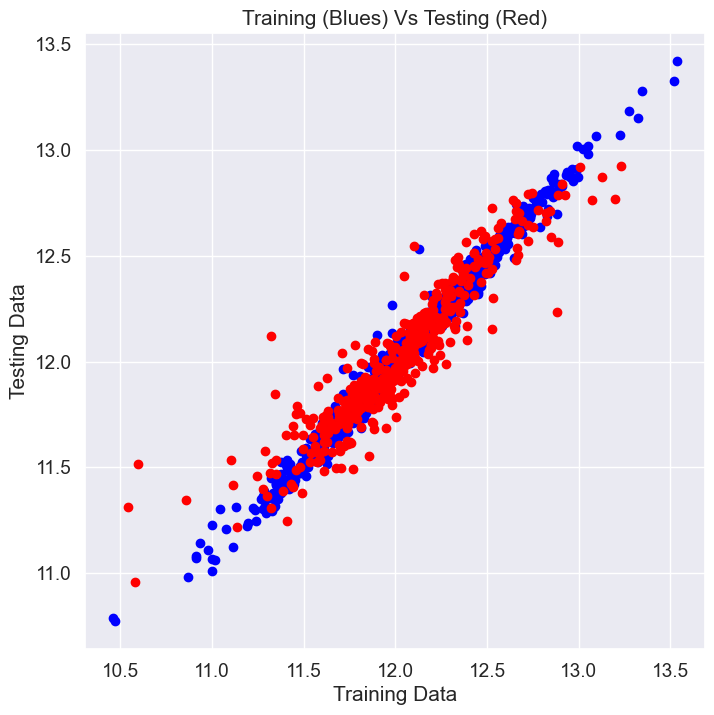

In [92]:
plt.figure(figsize=(8,8))
plt.scatter(y_train,y_pred_train_lr,color='blue')
plt.scatter(y_test,y_pred_test_lr,color='red')
plt.title('Training (Blues) Vs Testing (Red)')
plt.xlabel('Training Data')
plt.ylabel('Testing Data')
plt.show()

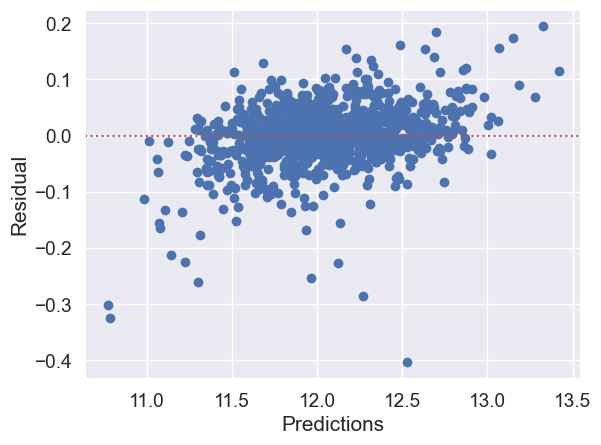

In [96]:
y_res = y_train - y_pred_train_lr
plt.scatter( y_pred_train_lr ,y_res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.show()

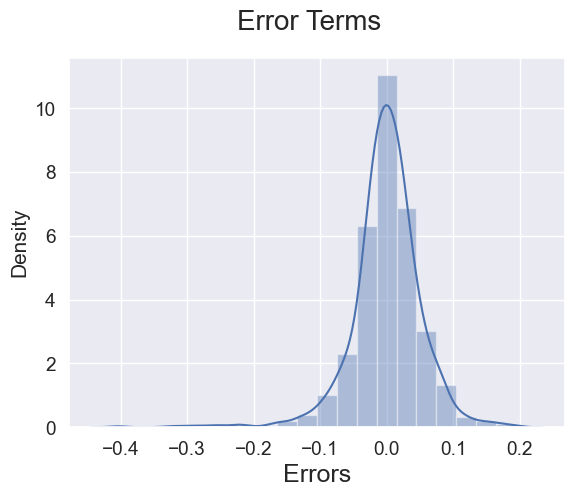

In [94]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_pred_train_lr), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  
plt.show()

# Regularized : Lasso Regression using Grid Search CV

In [97]:
#Generate a list of 50 values between 0 and 1.5
params = {'alpha': np.linspace(0.2, 0.6 , num = 100) }

In [98]:
np.linspace(0.2, 0.6 , num = 100)

array([0.2       , 0.2040404 , 0.20808081, 0.21212121, 0.21616162,
       0.22020202, 0.22424242, 0.22828283, 0.23232323, 0.23636364,
       0.24040404, 0.24444444, 0.24848485, 0.25252525, 0.25656566,
       0.26060606, 0.26464646, 0.26868687, 0.27272727, 0.27676768,
       0.28080808, 0.28484848, 0.28888889, 0.29292929, 0.2969697 ,
       0.3010101 , 0.30505051, 0.30909091, 0.31313131, 0.31717172,
       0.32121212, 0.32525253, 0.32929293, 0.33333333, 0.33737374,
       0.34141414, 0.34545455, 0.34949495, 0.35353535, 0.35757576,
       0.36161616, 0.36565657, 0.36969697, 0.37373737, 0.37777778,
       0.38181818, 0.38585859, 0.38989899, 0.39393939, 0.3979798 ,
       0.4020202 , 0.40606061, 0.41010101, 0.41414141, 0.41818182,
       0.42222222, 0.42626263, 0.43030303, 0.43434343, 0.43838384,
       0.44242424, 0.44646465, 0.45050505, 0.45454545, 0.45858586,
       0.46262626, 0.46666667, 0.47070707, 0.47474747, 0.47878788,
       0.48282828, 0.48686869, 0.49090909, 0.49494949, 0.49898

In [99]:
# list of alphas to tune
params = {'alpha': [0.00000001,0.0000001,0.000001,0.00001,0.0001, 0.001, 0.01, 0.05, 0.1,
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

In [100]:
# Importing the relevant libraries
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn import linear_model

In [101]:
# Applying Lasso
lasso = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = lasso,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-08, 1e-07, 1e-06, 1e-05, 0.0001, 0.001,
                                   0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                                   0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0,
                                   7.0, 8.0, 9.0, 10.0, 20, 50, 100, ...]},
             return_train_score=True, scoring='r2', verbose=1)

In [102]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.017401,0.003109,0.001423,5.253619e-04,0.0,{'alpha': 1e-08},0.918082,0.878940,0.795120,0.625125,0.876350,0.818723,0.104744,5,0.903683,0.911608,0.931148,0.909424,0.906747,0.912522,0.009683
1,0.014371,0.003428,0.000997,9.536743e-08,0.0,{'alpha': 1e-07},0.918080,0.878944,0.795122,0.625938,0.876349,0.818887,0.104443,4,0.903683,0.911608,0.931148,0.909424,0.906747,0.912522,0.009683
2,0.015150,0.003244,0.000989,1.730006e-05,0.000001,{'alpha': 1e-06},0.918069,0.878985,0.795144,0.633999,0.876341,0.820508,0.101473,3,0.903683,0.911608,0.931148,0.909423,0.906747,0.912522,0.009683
3,0.009562,0.003091,0.000797,3.987074e-04,0.00001,{'alpha': 1e-05},0.917956,0.879392,0.795359,0.662236,0.876259,0.826240,0.091203,2,0.903680,0.911605,0.931145,0.909415,0.906745,0.912518,0.009684
4,0.009369,0.002408,0.000598,4.881883e-04,0.0001,{'alpha': 0.0001},0.916472,0.882747,0.797391,0.661347,0.875331,0.826658,0.091396,1,0.903415,0.911308,0.930891,0.909329,0.906555,0.912300,0.009668


In [103]:
cv_results.to_csv('CV_RESULT_LASSO.csv')

In [105]:
print(model_cv.best_params_)
print(model_cv.best_score_)

{'alpha': 0.0001}
0.8266575268256127


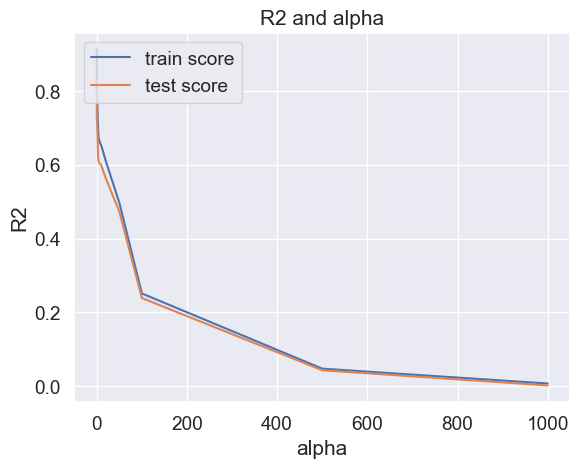

In [63]:
# plotting mean test and train scoes with alpha
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('R2')

plt.title("R2 and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [64]:
alpha = 0.5

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)

Lasso(alpha=0.5)

In [65]:
lasso.coef_

array([-3.39340967e-04, -0.00000000e+00,  1.52798562e-06,  0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  2.90887164e-03,  2.27090250e-03,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        3.62095643e-05, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
        6.12884130e-05, -0.00000000e+00,  4.69016984e-06, -4.66781587e-07,
        1.58214673e-04,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  5.54730340e-05, -0.00000000e+00,
        2.83702819e-04,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -

In [117]:
alpha = 0.6

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)
print("Training R2")
print(lasso.score(X_train,y_train))
print("Testing R2")
print(lasso.score(X_test,y_test))

Training R2
0.7894632362114777
Testing R2
0.7539125970815683


In [136]:
# list of alphas to tune
params = {'alpha': [0.01,0.1,
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

In [137]:
# Applying Lasso
lasso1 = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = lasso1,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                                   0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0,
                                   9.0, 10.0, 20, 50, 100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [138]:
model_cv.best_params_

{'alpha': 0.01}

In [139]:
model_cv.best_score_

0.805958336621749

In [140]:
model_cv.cv

5

### Best alpha=0.01 in Lasso

In [313]:
alpha = 0.01

lasso2 = Lasso(alpha=alpha)

lasso2.fit(X_train, y_train)
print("Training R2")
print(lasso2.score(X_train,y_train))
print("Testing R2")
print(lasso2.score(X_test,y_test))

Training R2
0.8693125109131994
Testing R2
0.8019141337602824


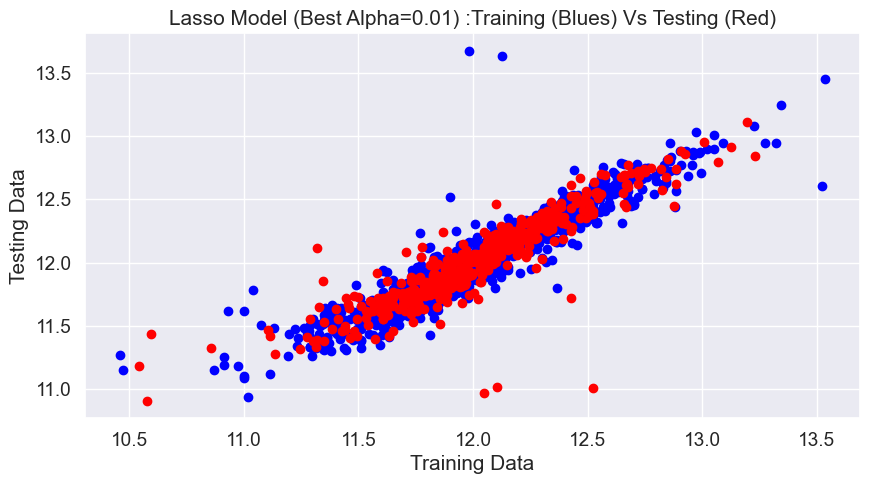

In [314]:
y_pred_train_lass=lasso2.predict(X_train)
y_pred_test_lass=lasso2.predict(X_test)
plt.figure(figsize=(10,5))
plt.scatter(y_train,y_pred_train_lass,color='blue')
plt.scatter(y_test,y_pred_test_lass,color='red')
plt.title('Lasso Model (Best Alpha=0.01) :Training (Blues) Vs Testing (Red)')
plt.xlabel('Training Data')
plt.ylabel('Testing Data')
plt.show()

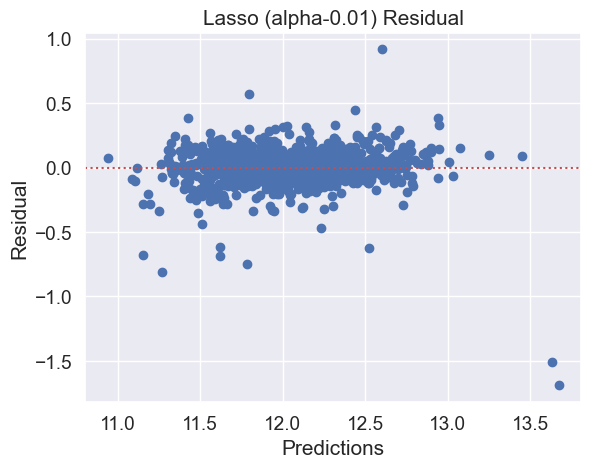

In [315]:
y_res_lass = y_train - y_pred_train_lass
plt.scatter( y_pred_train_lass ,y_res_lass)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.title('Lasso (alpha-0.01) Residual')
plt.show()

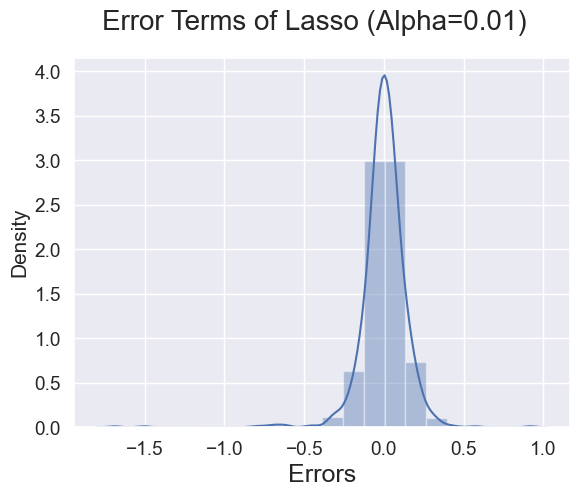

In [316]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_pred_train_lass), bins = 20)
fig.suptitle('Error Terms of Lasso (Alpha=0.01)', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  
plt.show()

In [279]:
dff=df.columns
dff

Index(['MSSubClass', 'MSZoning', 'LotArea', 'Street', 'Alley', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'Ope

In [280]:
lasso2.coef_

array([-6.77865818e-04, -1.02734249e-02,  1.90920194e-06,  0.00000000e+00,
        0.00000000e+00, -2.86218679e-04,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,  2.68178447e-03, -9.21810685e-03,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  6.96533346e-02,
        3.49621317e-02,  3.13240408e-03,  1.91229844e-03,  0.00000000e+00,
       -0.00000000e+00,  1.91072543e-03,  8.88065997e-04,  0.00000000e+00,
       -2.57653482e-05, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -2.36468207e-03, -2.44726166e-03,
        1.17583981e-04, -0.00000000e+00,  7.77835610e-05,  3.87668981e-05,
        2.62303906e-05,  0.00000000e+00,  3.85530922e-03,  0.00000000e+00,
       -0.00000000e+00,  2.10103182e-04,  2.42371880e-04,  2.20564496e-04,
        3.39910324e-05,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -

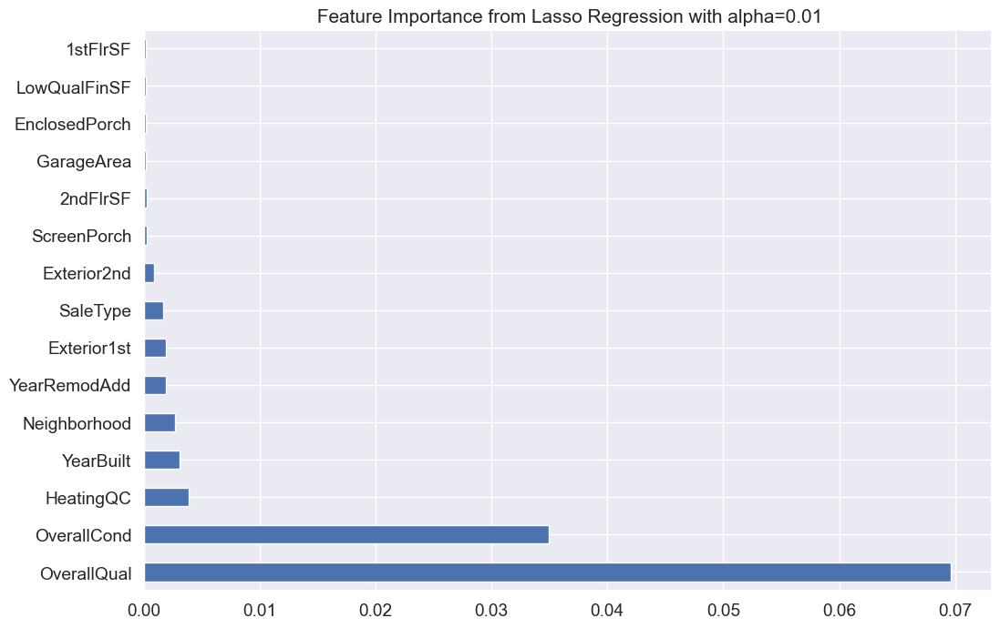

In [285]:
# Plotting top 25 feature importances
plt.figure(figsize=(12,8))
lasso_importance=pd.Series(lasso2.coef_,index=dff)
lasso_importance.nlargest(15).plot(kind='barh')
plt.title(" Feature Importance from Lasso Regression with alpha=0.01")
plt.show()

In [290]:
lasso_importance

MSSubClass      -0.000678
MSZoning        -0.010273
LotArea          0.000002
Street           0.000000
Alley            0.000000
LotShape        -0.000286
LandContour      0.000000
Utilities       -0.000000
LotConfig        0.000000
LandSlope       -0.000000
Neighborhood     0.002682
Condition1      -0.009218
Condition2      -0.000000
BldgType        -0.000000
HouseStyle       0.000000
OverallQual      0.069653
OverallCond      0.034962
YearBuilt        0.003132
YearRemodAdd     0.001912
RoofStyle        0.000000
RoofMatl        -0.000000
Exterior1st      0.001911
Exterior2nd      0.000888
MasVnrType       0.000000
MasVnrArea      -0.000026
ExterQual       -0.000000
ExterCond       -0.000000
Foundation       0.000000
BsmtQual         0.000000
BsmtCond        -0.000000
BsmtExposure    -0.002365
BsmtFinType1    -0.002447
BsmtFinSF1       0.000118
BsmtFinType2    -0.000000
BsmtFinSF2       0.000078
BsmtUnfSF        0.000039
TotalBsmtSF      0.000026
Heating          0.000000
HeatingQC   

In [292]:
lasso_imp=pd.DataFrame({'Features':lasso_importance.index,'Coeff':lasso_importance.values})
lasso_imp

,Features,Coeff
0,MSSubClass,-0.000678
1,MSZoning,-0.010273
2,LotArea,0.000002
3,Street,0.000000
4,Alley,0.000000
5,LotShape,-0.000286
6,LandContour,0.000000
7,Utilities,-0.000000
8,LotConfig,0.000000
9,LandSlope,-0.000000


In [308]:
X_train.shape

(1021, 78)

In [303]:
lasso_zero_coedd_col=list(lasso_imp[lasso_imp['Coeff']==0]['Features'])
len(lasso_zero_coedd_col)

42

In [309]:
# Zeor coefficient values
print(lasso_zero_coedd_col)

['Street', 'Alley', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtFinType2', 'Heating', 'CentralAir', 'Electrical', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'SaleCondition']


In [190]:
# Top 5 importance of lasso importances
lasso_importance.nlargest(5).index

Index(['OverallQual', 'OverallCond', 'HeatingQC', 'YearBuilt', 'Neighborhood'], dtype='object')

Therefore out of 78 predictors, Lasso has given 42 predictors coefficents as 0. Hence the main predctors remain 36 variables only

# Doulbling the value of Lasso Alpha

Previously the best value of alpha in lasso regression found to be 0.01.         As per the probelem statement the alpha value to be doubled. Hence alpha value of Lasso regression will be 0.02

In [216]:
alpha = 0.02

lasso3 = Lasso(alpha=alpha)

lasso3.fit(X_train, y_train)
print("Training R2")
print(lasso3.score(X_train,y_train))
print("Testing R2")
print(lasso3.score(X_test,y_test))

Training R2
0.8608762884640141
Testing R2
0.7862699862509023


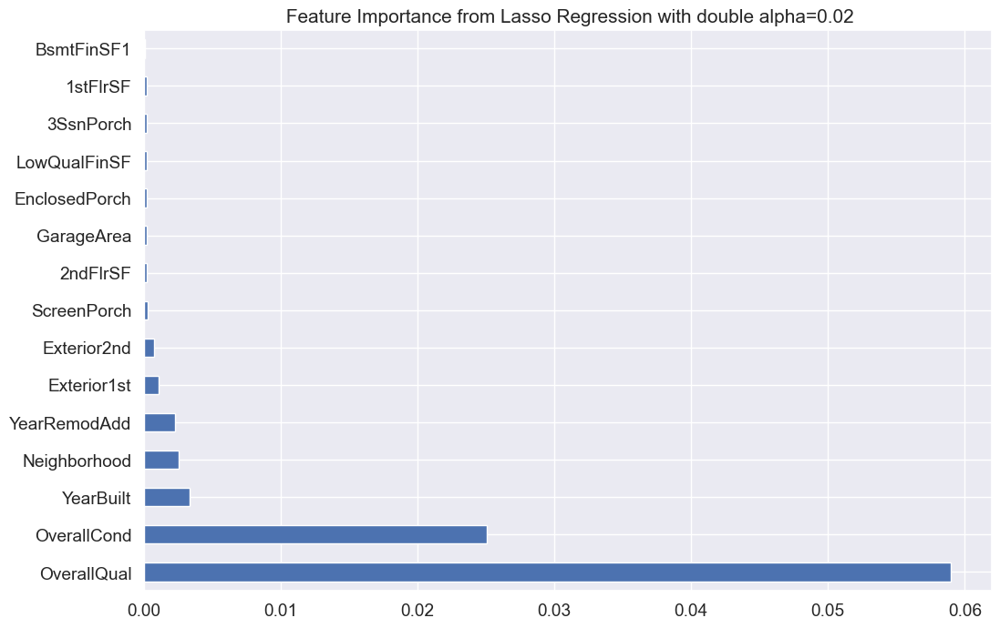

In [220]:
# Plotting top 25 feature importances
plt.figure(figsize=(12,8))
lasso_importance3=pd.Series(lasso3.coef_,index=dff)
lasso_importance3.nlargest(15).plot(kind='barh')
plt.title(" Feature Importance from Lasso Regression with double alpha=0.02")
plt.show()

In [317]:
# Top 5 importance of lasso importances
lasso_importance3.nlargest(5).index

Index(['OverallQual', 'OverallCond', 'YearBuilt', 'Neighborhood',
       'YearRemodAdd'],
      dtype='object')

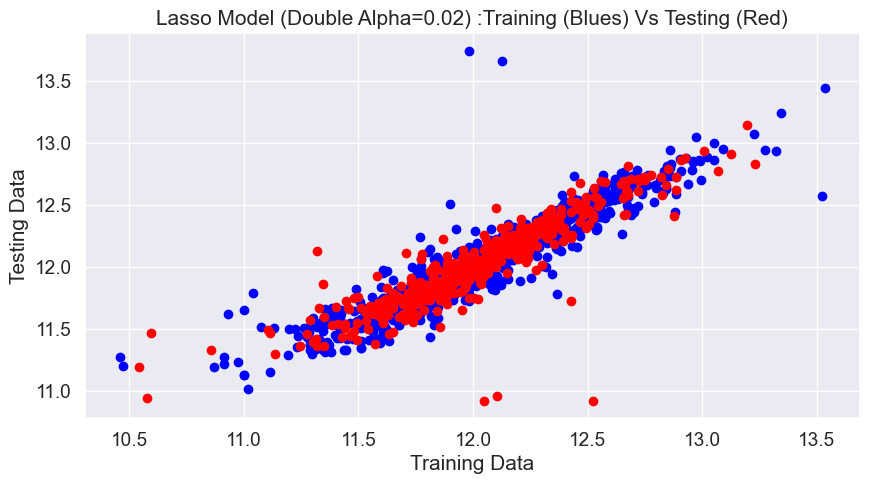

In [219]:
y_pred_train_lass3=lasso3.predict(X_train)
y_pred_test_lass3=lasso3.predict(X_test)
plt.figure(figsize=(10,5))
plt.scatter(y_train,y_pred_train_lass3,color='blue')
plt.scatter(y_test,y_pred_test_lass3,color='red')
plt.title('Lasso Model (Double Alpha=0.02) :Training (Blues) Vs Testing (Red)')
plt.xlabel('Training Data')
plt.ylabel('Testing Data')
plt.show()

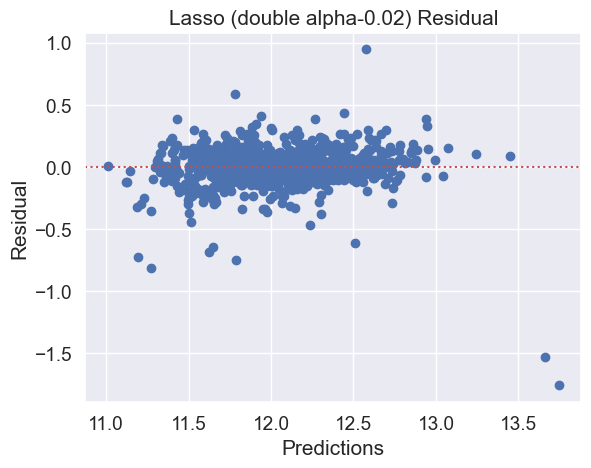

In [222]:
y_res_lass3 = y_train - y_pred_train_lass3
plt.scatter( y_pred_train_lass3 ,y_res_lass3)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.title('Lasso (double alpha-0.02) Residual')
plt.show()

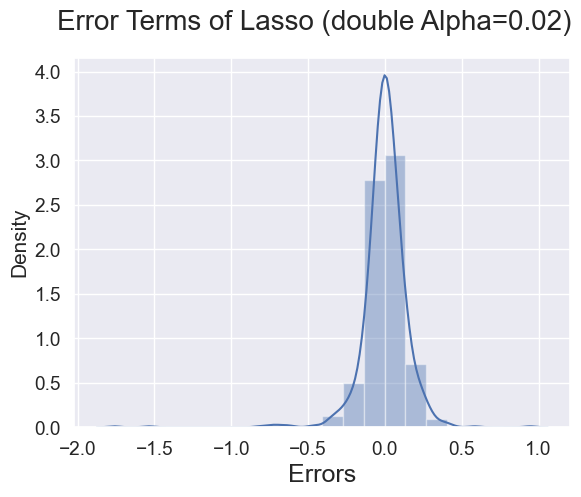

In [224]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_pred_train_lass3), bins = 20)
fig.suptitle('Error Terms of Lasso (double Alpha=0.02)', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  
plt.show()

# Dropping to 5 feature variables & rebuilding the model

In [194]:
df.shape, X_train.shape,y_train.shape, X_test.shape, y_test.shape

((1459, 78), (1021, 78), (1021,), (438, 78), (438,))

In [196]:
col_rem=list(lasso_importance.nlargest(5).index)
col_rem

['OverallQual', 'OverallCond', 'HeatingQC', 'YearBuilt', 'Neighborhood']

In [199]:
df_5=df.drop(col_rem,axis=1)
df_5.shape

(1459, 73)

In [200]:
X5=df_5.copy()

In [201]:
X5.shape

(1459, 73)

In [202]:
X5.columns

Index(['MSSubClass', 'MSZoning', 'LotArea', 'Street', 'Alley', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'CentralAir',
       'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'Poo

In [204]:
y5=y.copy()
y5

array([12.24769432, 12.10901093, 12.31716669, ..., 12.49312952,
       11.86446223, 11.90158345])

In [205]:
# # split into train and test
from sklearn.model_selection import train_test_split
X5_train, X5_test, y5_train, y5_test = train_test_split(X5, y5,
                                                     train_size=0.7,
                                                     test_size = 0.3, random_state=100)

In [206]:
X5_train.shape,y5_train.shape,X5_test.shape,y5_test.shape

((1021, 73), (1021,), (438, 73), (438,))

In [207]:
alpha = 0.01

lasso5 = Lasso(alpha=alpha)

lasso5.fit(X5_train, y5_train)
print("Training R2")
print(lasso5.score(X5_train,y5_train))
print("Testing R2")
print(lasso5.score(X5_test,y5_test))

Training R2
0.8216396748202425
Testing R2
0.7484281126148151


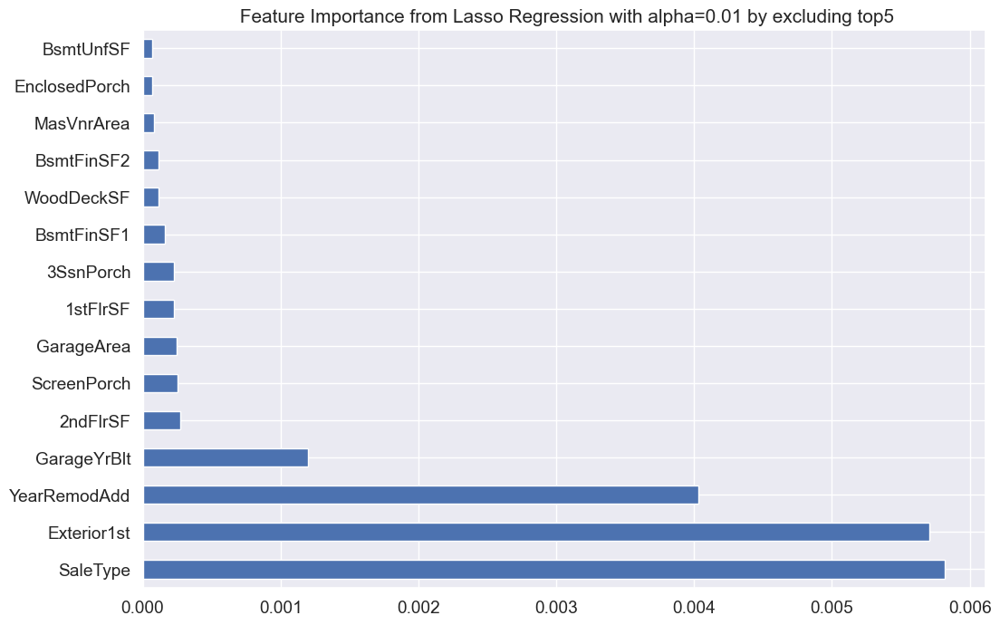

In [209]:
# Plotting top 25 feature importances
plt.figure(figsize=(12,8))
lasso5_importance=pd.Series(lasso5.coef_,index=X5.columns)
lasso5_importance.nlargest(15).plot(kind='barh')
plt.title(" Feature Importance from Lasso Regression with alpha=0.01 by excluding top5")
plt.show()

In [323]:
lasso5_importance.nlargest(5).index

Index(['SaleType', 'Exterior1st', 'YearRemodAdd', 'GarageYrBlt', '2ndFlrSF'], dtype='object')

#### Model Evaluation 

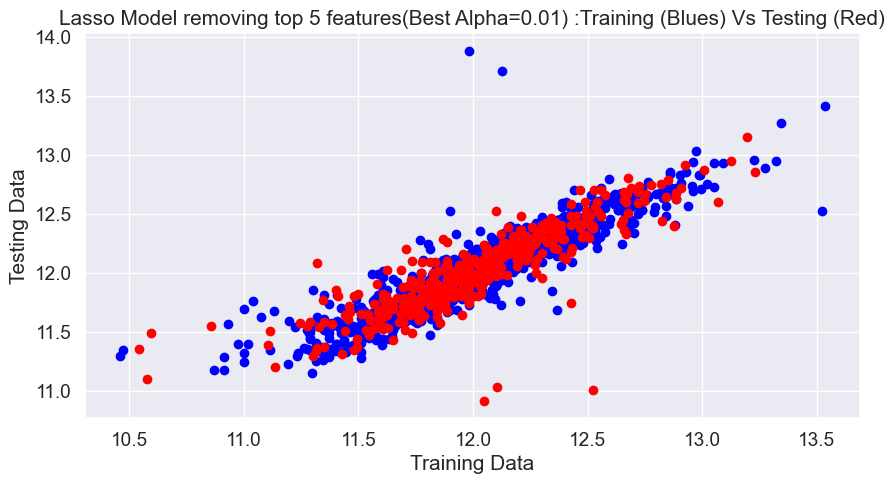

In [210]:
y_pred_train_lass5=lasso5.predict(X5_train)
y_pred_test_lass5=lasso5.predict(X5_test)
plt.figure(figsize=(10,5))
plt.scatter(y5_train,y_pred_train_lass5,color='blue')
plt.scatter(y5_test,y_pred_test_lass5,color='red')
plt.title('Lasso Model removing top 5 features(Best Alpha=0.01) :Training (Blues) Vs Testing (Red)')
plt.xlabel('Training Data')
plt.ylabel('Testing Data')
plt.show()

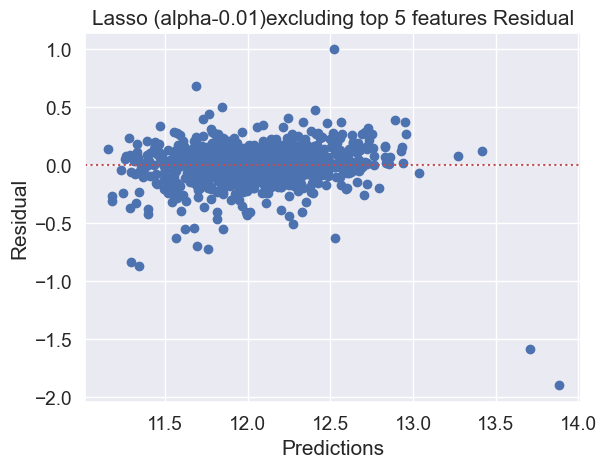

In [212]:
y_res_lass5 = y5_train - y_pred_train_lass5
plt.scatter( y_pred_train_lass5 ,y_res_lass5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.title('Lasso (alpha-0.01)excluding top 5 features Residual')
plt.show()

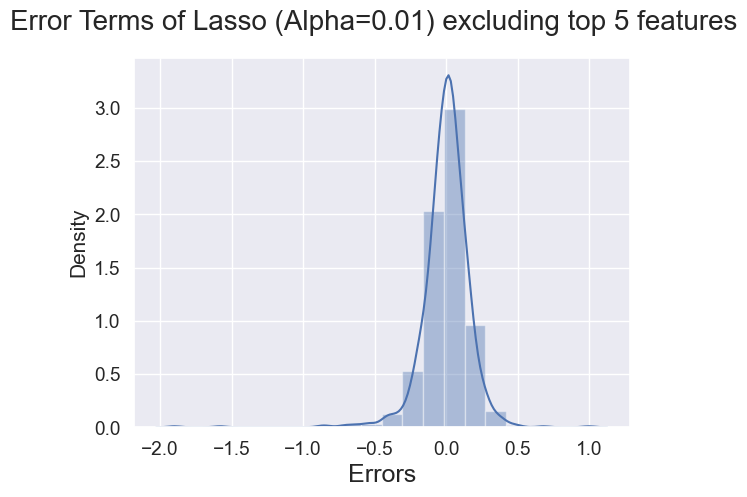

In [215]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y5_train - y_pred_train_lass5), bins = 20)
fig.suptitle('Error Terms of Lasso (Alpha=0.01) excluding top 5 features', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  
plt.show()

====================================================================================================================

# Ridge Regression

In [225]:
# Applying Ridge
ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge,
                        param_grid = params,
                        scoring= 'neg_mean_absolute_error',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                                   0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0,
                                   9.0, 10.0, 20, 50, 100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [226]:
model_cv.best_estimator_

Ridge(alpha=0.01)

In [227]:
model_cv.cv

5

In [168]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.003420,0.000785,0.000997,0.000001,0.01,{'alpha': 0.01},-0.085566,-0.099549,-0.103533,-0.099547,-0.093033,-0.096246,0.006313,1,-0.085771,-0.081697,-0.075573,-0.083424,-0.083101,-0.081913,0.003430
1,0.002994,0.000631,0.001196,0.000398,0.1,{'alpha': 0.1},-0.086808,-0.099673,-0.104359,-0.099009,-0.094190,-0.096808,0.005949,2,-0.087031,-0.083329,-0.076015,-0.083442,-0.084411,-0.082845,0.003666
2,0.002837,0.000432,0.001026,0.000054,0.2,{'alpha': 0.2},-0.087916,-0.100069,-0.105383,-0.098940,-0.095178,-0.097497,0.005798,3,-0.088012,-0.084537,-0.076850,-0.083445,-0.085598,-0.083688,0.003738
3,0.002829,0.000422,0.000984,0.000056,0.3,{'alpha': 0.3},-0.088715,-0.101743,-0.106147,-0.098906,-0.096056,-0.098313,0.005843,4,-0.088723,-0.085337,-0.077650,-0.083452,-0.086632,-0.084359,0.003768
4,0.002587,0.000486,0.000798,0.000399,0.4,{'alpha': 0.4},-0.089328,-0.102951,-0.106710,-0.098881,-0.096838,-0.098941,0.005887,6,-0.089244,-0.085915,-0.078308,-0.083457,-0.087419,-0.084868,0.003789


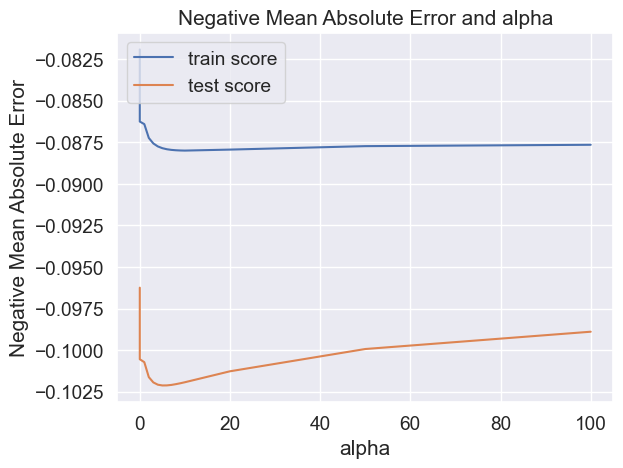

In [169]:
# plotting mean test and train scoes with alpha
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [240]:
alpha = 10
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([-5.62981985e-04, -1.69922353e-02,  1.47830873e-06,  6.19717956e-02,
        1.89592155e-02, -1.01422611e-02,  2.75237852e-02, -1.63168240e-02,
        1.06947559e-02, -1.73888974e-02,  3.15451051e-03, -1.12019934e-02,
       -2.32265504e-02, -4.24406486e-03,  4.02597672e-03,  7.41971813e-02,
        4.40114173e-02,  1.92702713e-03,  1.02157269e-03,  4.57915559e-03,
       -4.57524621e-03,  2.39134596e-03,  1.65773859e-03, -7.73487354e-04,
       -6.09214849e-06, -1.23545126e-02,  7.34129200e-04,  4.74500844e-03,
        1.26601533e-02, -1.14200095e-02, -1.76406447e-02, -4.05385370e-03,
        3.90966023e-05, -4.39681959e-03, -7.46730494e-06,  3.25598573e-06,
        3.48852867e-05, -5.32488083e-03,  9.82304133e-03,  6.08037752e-02,
        1.87695153e-03,  5.63174007e-05,  5.16682709e-05,  4.99902113e-05,
        1.57975868e-04,  5.70964611e-02,  1.38052642e-02,  5.08659454e-02,
        1.94864256e-02,  2.93117914e-03, -1.62607548e-02,  7.09919418e-03,
        4.44229699e-03, -

In [242]:
print(ridge.score(X_train,y_train))
print(ridge.score(X_test,y_test))

0.8904046878526095
0.8164704981493607


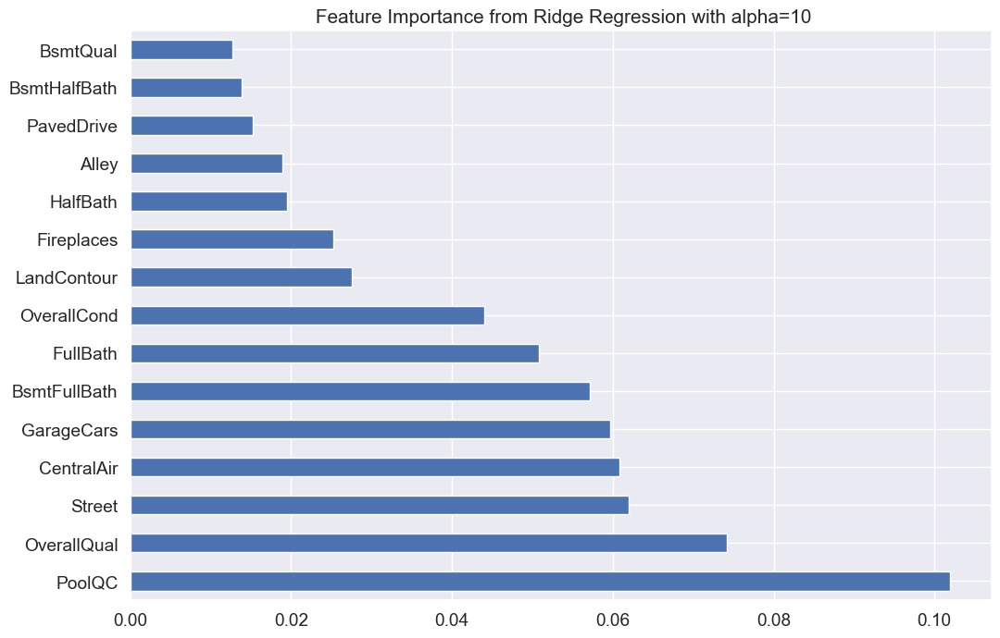

In [171]:
# Plotting top 25 feature importances
plt.figure(figsize=(12,8))
ridge_importance=pd.Series(ridge.coef_,index=dff)
ridge_importance.nlargest(15).plot(kind='barh')
plt.title(" Feature Importance from Ridge Regression with alpha=10")
plt.show()

In [261]:
# list of alphas to tune
params = {'alpha': [10,11,12,13,14, 15,20,30,40,50,60,70, 75,80,90,100,110,20,125,150,200,300,400, 500, 1000 ]}
# Applying Lasso
ridge1 = Ridge()

# cross validation
folds = 5
model_cv1 = GridSearchCV(estimator = ridge1,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv1.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [10, 11, 12, 13, 14, 15, 20, 30, 40, 50, 60,
                                   70, 75, 80, 90, 100, 110, 20, 125, 150, 200,
                                   300, 400, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [262]:
model_cv1.best_estimator_

Ridge(alpha=90)

### Ridge at best alpha=90

In [267]:
alpha = 90
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([-6.18986220e-04, -1.73852827e-02,  1.52357056e-06,  1.05541143e-02,
        1.20969325e-02, -9.82099186e-03,  2.14646299e-02, -1.95141182e-03,
        8.25260837e-03, -6.21598657e-03,  3.08757872e-03, -1.11848159e-02,
       -1.71204617e-02, -1.09193044e-03,  3.42517665e-03,  6.73037734e-02,
        4.13638084e-02,  2.37797172e-03,  1.32626464e-03,  4.08351769e-03,
       -2.56589915e-03,  2.75278082e-03,  1.22072271e-03,  1.70131065e-04,
       -1.16404647e-05, -9.75152506e-03,  1.39713702e-05,  5.65059211e-03,
        9.89279364e-03, -1.25651322e-02, -1.63506267e-02, -5.37092115e-03,
        4.79172919e-05, -4.12285981e-03,  5.84071810e-07, -6.33843626e-06,
        4.21629277e-05, -2.21881545e-03,  9.77603050e-03,  2.42668437e-02,
       -3.34405838e-03,  5.61399093e-05,  6.29064065e-05,  5.70054371e-05,
        1.76051751e-04,  3.25604697e-02,  3.25760429e-03,  2.79459229e-02,
        6.57060359e-03,  3.47366599e-03, -5.15805068e-03,  5.44914646e-03,
        3.89387521e-03, -

In [268]:
print(ridge.score(X_train, y_train))
print(ridge.score(X_test,y_test))    

0.8857168074730811
0.8286328115168936


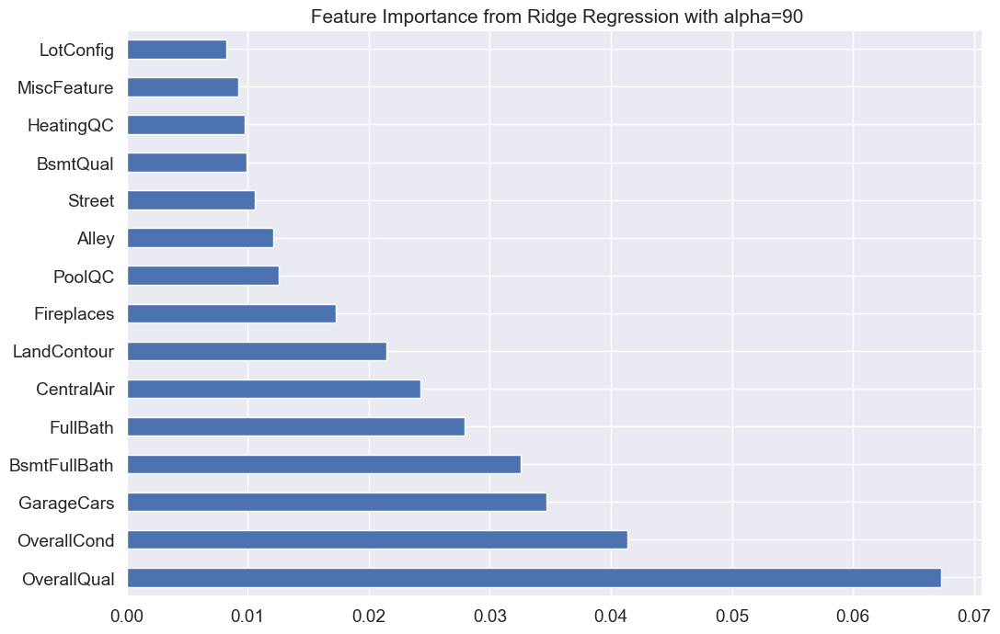

In [270]:
# Plotting top 25 feature importances
plt.figure(figsize=(12,8))
ridge_importance=pd.Series(ridge.coef_,index=dff)
ridge_importance.nlargest(15).plot(kind='barh')
plt.title(" Feature Importance from Ridge Regression with alpha=90")
plt.show()

In [318]:
# Top 5 importance of lasso importances
ridge_importance.nlargest(5).index

Index(['OverallQual', 'OverallCond', 'GarageCars', 'BsmtFullBath', 'FullBath'], dtype='object')

### Doubling best Ridge at best alpha=90  i.e, alpha=180

In [319]:
alpha = 180
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.score(X_train, y_train))
print(ridge.score(X_test,y_test))  

0.8825016556914678
0.8230303294695211


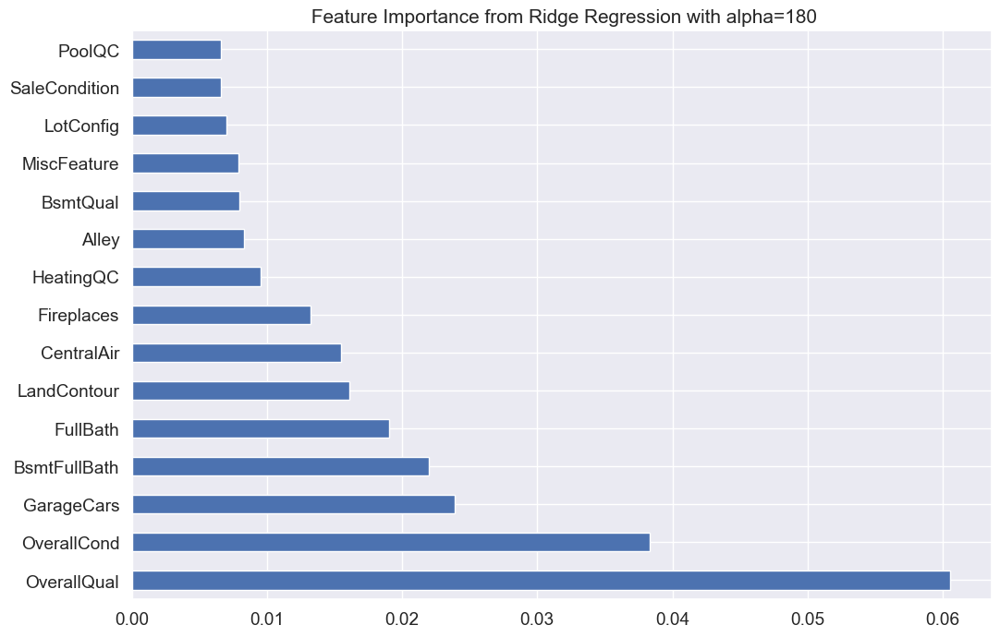

In [320]:
# Plotting top 25 feature importances
plt.figure(figsize=(12,8))
ridge_importance=pd.Series(ridge.coef_,index=dff)
ridge_importance.nlargest(15).plot(kind='barh')
plt.title(" Feature Importance from Ridge Regression with alpha=180")
plt.show()

In [321]:
# Top 5 importance of lasso importances
ridge_importance.nlargest(5).index

Index(['OverallQual', 'OverallCond', 'GarageCars', 'BsmtFullBath', 'FullBath'], dtype='object')

# Tree Feature Importance

In [85]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((1021, 78), (1021,), (438, 78), (438,))

In [86]:
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
selection=ExtraTreesRegressor()
selection.fit(X_train,y_train)
selection.feature_importances_

array([5.74878192e-03, 6.36154348e-03, 7.06914467e-03, 1.20963282e-04,
       1.01001063e-03, 2.40532711e-03, 2.84414226e-03, 3.16793960e-06,
       1.81639471e-03, 1.00442750e-03, 1.01589851e-02, 1.56706743e-03,
       3.62764149e-04, 3.45103330e-03, 1.59999262e-03, 2.73105878e-01,
       6.38444809e-03, 6.28911743e-02, 2.49389481e-02, 1.26746692e-03,
       6.67635863e-04, 2.31597678e-03, 3.21245419e-03, 1.54442305e-03,
       2.21953996e-03, 2.16736524e-02, 2.58850186e-03, 2.17909135e-03,
       1.24006798e-02, 4.58687375e-03, 4.84907149e-03, 3.23070841e-03,
       1.14641972e-02, 1.27744686e-03, 1.32518222e-03, 2.46917236e-03,
       2.05784682e-02, 5.42091383e-04, 2.28773925e-03, 3.90737610e-02,
       1.71648344e-03, 2.08213435e-02, 8.53703419e-03, 3.07802917e-04,
       8.03517319e-02, 7.90525561e-03, 1.02901504e-03, 6.69897322e-02,
       4.93051387e-03, 7.64029604e-03, 3.27507560e-03, 1.20196580e-02,
       8.55878608e-03, 1.36933467e-03, 1.82342940e-02, 3.52119869e-02,
      

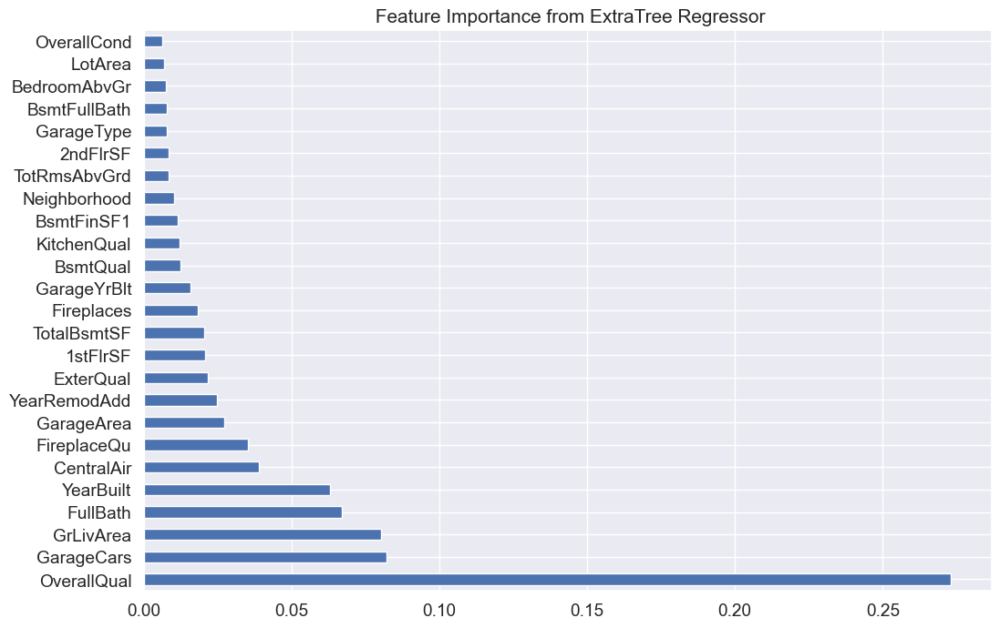

In [87]:
# Plotting top 25 feature importances
plt.figure(figsize=(12,8))
feat_importances_extratree=pd.Series(selection.feature_importances_,index=dff)
feat_importances_extratree.nlargest(25).plot(kind='barh')
plt.title(" Feature Importance from ExtraTree Regressor")
plt.show()

### Random Forest Model 

In [173]:
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train,y_train)
print("Training R2")
print(rf.score(X_train,y_train))
print("Testing R2")
print(rf.score(X_test,y_test))

Training R2
0.9810939709154732
Testing R2
0.8539408081436708


In [174]:
# Get the feature importances
feature_importances1 = rf.feature_importances_

# Create a list of feature names
feature_names = df.columns  # Assuming your features are in a DataFrame

# Combine feature names with their importances
feature_importance_pairs = list(zip(feature_names, feature_importances1))

# Sort the pairs by importance in descending order
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)

# Select the top 10 features
top_10_features = feature_importance_pairs[:20]

# Print the top 10 features and their importances
for feature, importance in top_10_features:
    print(f"{feature}: {importance:.4f}")

OverallQual: 0.5220
GrLivArea: 0.1235
TotalBsmtSF: 0.0558
GarageArea: 0.0408
GarageCars: 0.0253
BsmtFinSF1: 0.0245
CentralAir: 0.0189
1stFlrSF: 0.0174
YearBuilt: 0.0169
Neighborhood: 0.0120
LotArea: 0.0109
OverallCond: 0.0097
YearRemodAdd: 0.0076
BsmtQual: 0.0069
2ndFlrSF: 0.0065
GarageType: 0.0057
BsmtUnfSF: 0.0055
MSZoning: 0.0053
OpenPorchSF: 0.0048
GarageYrBlt: 0.0044


In [175]:
pd.DataFrame(top_10_features)

,0,1
0,OverallQual,0.522021
1,GrLivArea,0.123546
2,TotalBsmtSF,0.055831
3,GarageArea,0.040774
4,GarageCars,0.025319
5,BsmtFinSF1,0.024503
6,CentralAir,0.018853
7,1stFlrSF,0.017411
8,YearBuilt,0.016885
9,Neighborhood,0.012012


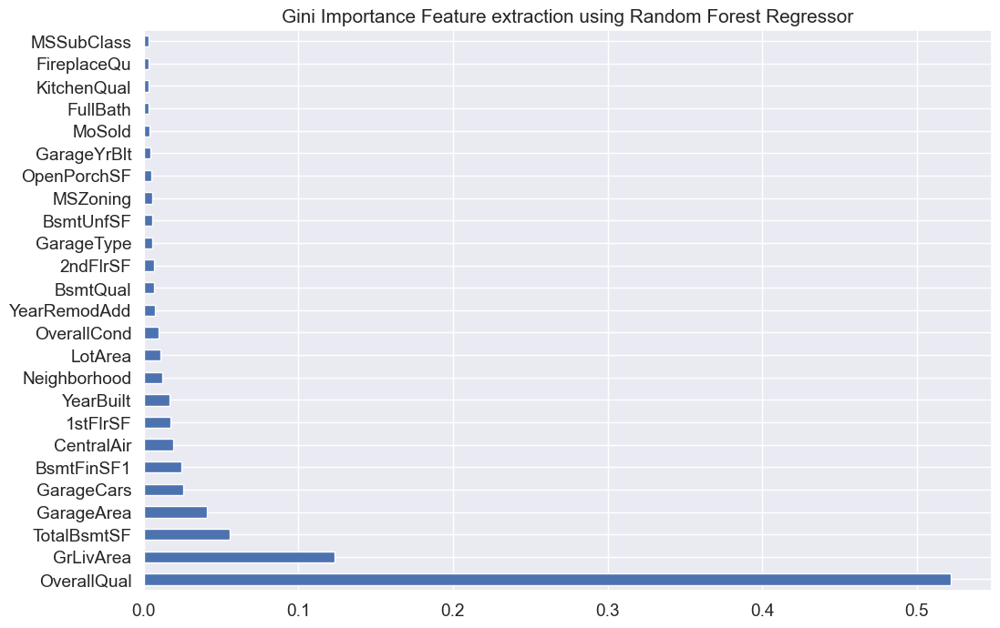

In [176]:
plt.figure(figsize=(12,8))
feat_importances1=pd.Series(rf.feature_importances_,index=dff)
feat_importances1.nlargest(25).plot(kind='barh')
plt.title('Gini Importance Feature extraction using Random Forest Regressor')
plt.show()

### Model Evaluation 

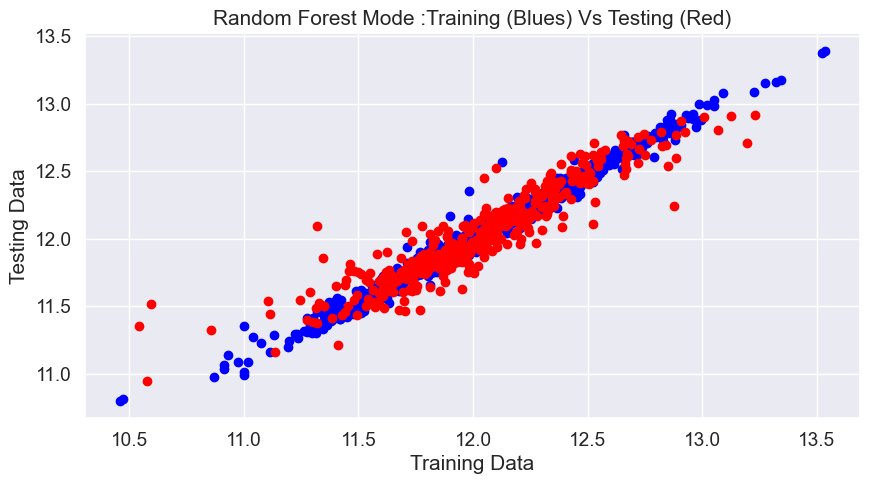

In [179]:
y_pred_train_rf=rf.predict(X_train)
y_pred_test_rf=rf.predict(X_test)
plt.figure(figsize=(10,5))
plt.scatter(y_train,y_pred_train_rf,color='blue')
plt.scatter(y_test,y_pred_test_rf,color='red')
plt.title('Random Forest Mode :Training (Blues) Vs Testing (Red)')
plt.xlabel('Training Data')
plt.ylabel('Testing Data')
plt.show()

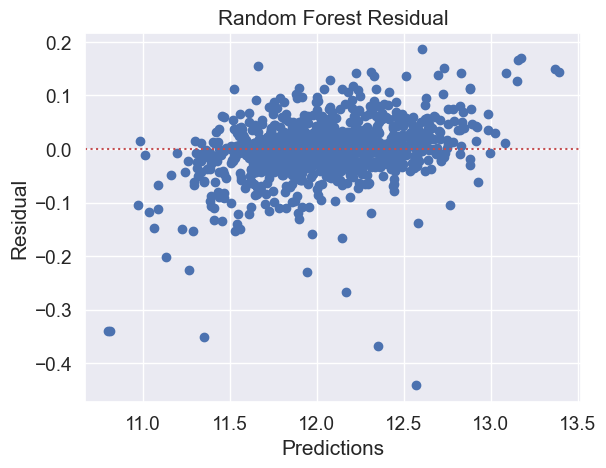

In [181]:
y_res_rf = y_train - y_pred_train_rf
plt.scatter( y_pred_train_rf ,y_res_rf)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.title('Random Forest Residual')
plt.show()

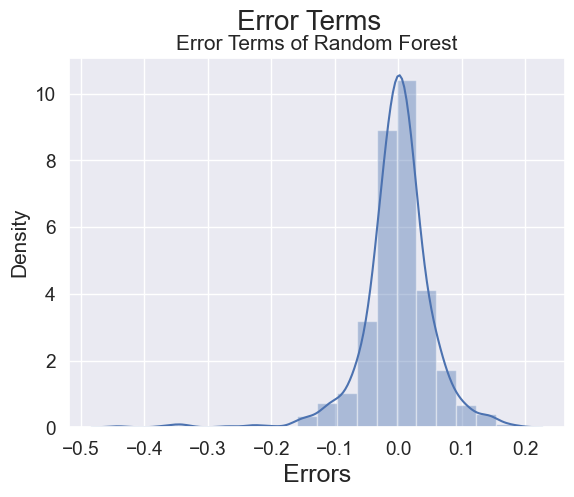

In [182]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_pred_train_rf), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)
plt.title('Error Terms of Random Forest')
plt.show()